In [1]:
!tar -xvf ff5da6d6ecae486bb294aeaf5ee8f8a1.tar.gz

Streaming output truncated to the last 5000 lines.
ff5da6d6ecae486bb294aeaf5ee8f8a1/camera_0001/obj_0002/segmentation_00019.png
ff5da6d6ecae486bb294aeaf5ee8f8a1/camera_0001/obj_0002/depth_00000.tiff
ff5da6d6ecae486bb294aeaf5ee8f8a1/camera_0001/obj_0002/segmentation_00017.png
ff5da6d6ecae486bb294aeaf5ee8f8a1/camera_0001/obj_0002/segmentation_00010.png
ff5da6d6ecae486bb294aeaf5ee8f8a1/camera_0001/obj_0002/rgba_00014.png
ff5da6d6ecae486bb294aeaf5ee8f8a1/camera_0001/obj_0002/rgba_00013.png
ff5da6d6ecae486bb294aeaf5ee8f8a1/camera_0001/obj_0002/depth_00005.tiff
ff5da6d6ecae486bb294aeaf5ee8f8a1/camera_0001/obj_0002/depth_00019.tiff
ff5da6d6ecae486bb294aeaf5ee8f8a1/camera_0001/obj_0002/segmentation_00009.png
ff5da6d6ecae486bb294aeaf5ee8f8a1/camera_0001/obj_0002/segmentation_00007.png
ff5da6d6ecae486bb294aeaf5ee8f8a1/camera_0001/obj_0002/depth_00001.tiff
ff5da6d6ecae486bb294aeaf5ee8f8a1/camera_0001/obj_0002/rgba_00021.png
ff5da6d6ecae486bb294aeaf5ee8f8a1/camera_0001/obj_0002/segmentation_00000.

# Libraries

In [ ]:
# Core libraries
import math
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
from PIL import Image

# PyTorch libraries
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim

# PyTorch utilities
from torch.utils.data import Dataset, DataLoader, random_split
from torchvision import transforms

# Progress
from tqdm import tqdm

# Task

In [ ]:
from torch.utils.data import Dataset
from pathlib import Path
from PIL import Image
import torch
import numpy as np
from torchvision import transforms

class ModalToAmodalRGBDataset(Dataset):
    def __init__(self, root_dir, camera_name="camera_0001", size=(256, 256)):
        self.root_dir = Path(root_dir)
        self.size = size
        self.samples = []

        camera_path = self.root_dir / camera_name
        obj_paths = sorted(camera_path.glob("obj_*"))

        if not obj_paths:
            raise ValueError(f"No objects found in {camera_path}")

        num_frames = len(list(obj_paths[0].glob("rgba_*.png")))
        for frame_id in range(num_frames):
            frame_str = f"{frame_id:05d}"
            for obj_path in obj_paths:
                self.samples.append({
                    "object_path": obj_path,
                    "frame_id": frame_str
                })

        self.resize = transforms.Resize(self.size)
        self.to_tensor = transforms.ToTensor()

    def __len__(self):
        return len(self.samples)

    def __getitem__(self, idx):
        sample = self.samples[idx]
        obj_path = sample["object_path"]
        frame_id = sample["frame_id"]
        obj_id = int(obj_path.name.split("_")[1])

        # Load RGB image
        rgb_path = obj_path / f"rgba_{frame_id}.png"
        scene_rgb = Image.open(rgb_path).convert("RGB")
        scene_rgb_tensor = self.to_tensor(scene_rgb)

        # Load segmentation masks
        obj_seg_path = obj_path / f"segmentation_{frame_id}.png"            # amodal (object only)
        scene_seg_path = obj_path.parent / f"segmentation_{frame_id}.png"   # full scene

        obj_seg = np.array(Image.open(obj_seg_path))
        scene_seg = np.array(Image.open(scene_seg_path))

        # Compute masks
        amodal_mask_np = (obj_seg == obj_id).astype(np.float32)
        modal_mask_np = ((obj_seg == obj_id) & (scene_seg == obj_id)).astype(np.float32)

        amodal_mask = torch.from_numpy(amodal_mask_np).unsqueeze(0)
        modal_mask = torch.from_numpy(modal_mask_np).unsqueeze(0)

        # Create input tensor: [1 + 3 + 3] = 7 channels
        masked_rgb = scene_rgb_tensor * modal_mask
        repeated_mask = amodal_mask.repeat(3, 1, 1)
        input_tensor = torch.cat([amodal_mask, masked_rgb, repeated_mask], dim=0)

        # Ground truth target
        target_tensor = self.to_tensor(Image.open(rgb_path).convert("RGB"))

        # Resize
        input_tensor = self.resize(input_tensor)
        target_tensor = self.resize(target_tensor)

        return input_tensor, target_tensor


In [ ]:
from pathlib import Path
import matplotlib.pyplot as plt
from torchvision.transforms import ToPILImage

# Assuming ModalToAmodalRGBDataset is already defined and available

# Set up test root directory
test_root = Path("/content")  # Replace with your actual root if needed

# Instantiate the dataset
dataset = ModalToAmodalRGBDataset(test_root, camera_name="camera_0001", size=(256, 256))

# Create a test function to visualize modal and amodal content
def test_modal_to_amodal_dataset(dataset, idx=0):
    input_tensor, target_tensor = dataset[idx]

    amodal_mask = input_tensor[0:1]
    masked_rgb = input_tensor[1:4]
    repeated_mask = input_tensor[4:7]

    to_pil = ToPILImage()

    print(f"Input tensor shape: {input_tensor.shape}")
    print(f"Target tensor shape: {target_tensor.shape}")

    fig, axs = plt.subplots(1, 5, figsize=(20, 5))
    axs[0].imshow(to_pil(amodal_mask))
    axs[0].set_title("Amodal Mask")

    axs[1].imshow(to_pil(masked_rgb))
    axs[1].set_title("Masked RGB (Input)")

    axs[2].imshow(to_pil(repeated_mask))
    axs[2].set_title("Repeated Mask Channels")

    axs[3].imshow(to_pil(target_tensor))
    axs[3].set_title("Target RGB (Ground Truth)")

    # Optionally display the full scene image for reference
    sample_info = dataset.samples[idx]
    scene_path = sample_info["object_path"].parent / f"rgba_{sample_info['frame_id']}.png"
    if scene_path.exists():
        scene_img = Image.open(scene_path).convert("RGB")
        axs[4].imshow(scene_img)
        axs[4].set_title("Full Scene")
    else:
        axs[4].axis("off")

    for ax in axs:
        ax.axis("off")
    plt.tight_layout()
    plt.show()

# Run the test visualization
test_modal_to_amodal_dataset(dataset, idx=22)




ValueError: No objects found in /content/camera_0001


🔍 Index: 0, Frame: 00011, Object: obj_0015


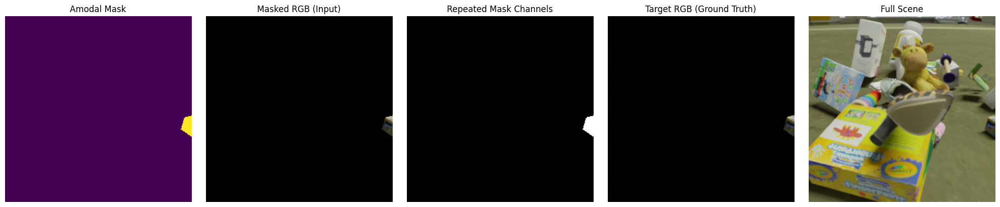


🔍 Index: 1, Frame: 00013, Object: obj_0010


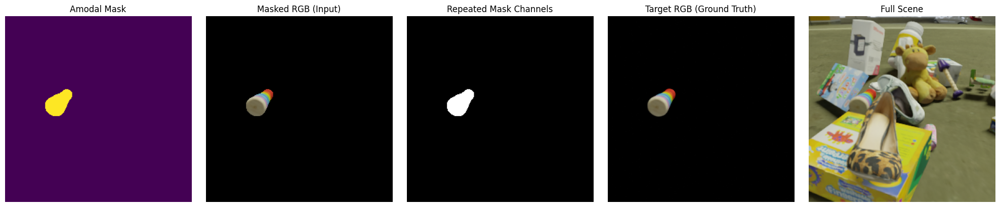


🔍 Index: 2, Frame: 00004, Object: obj_0014


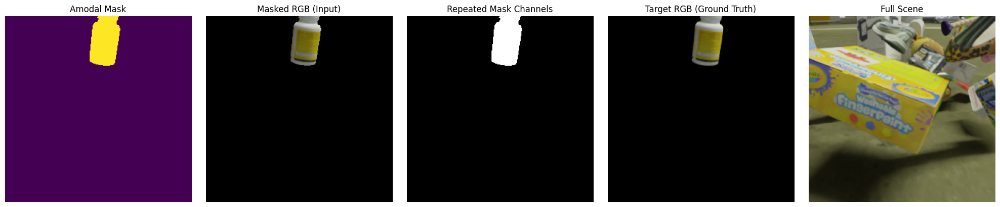


🔍 Index: 3, Frame: 00011, Object: obj_0003


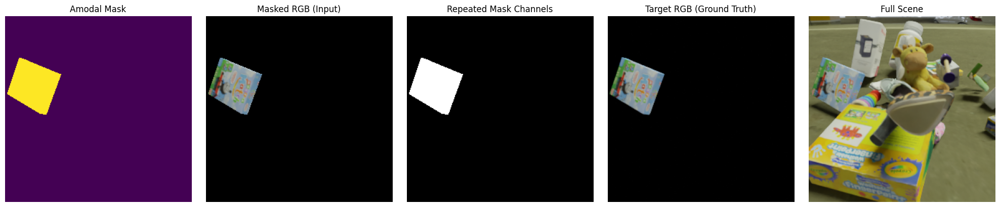


🔍 Index: 4, Frame: 00009, Object: obj_0016


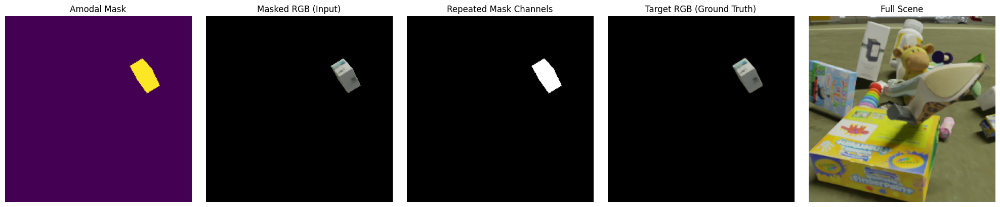


🔍 Index: 5, Frame: 00015, Object: obj_0006


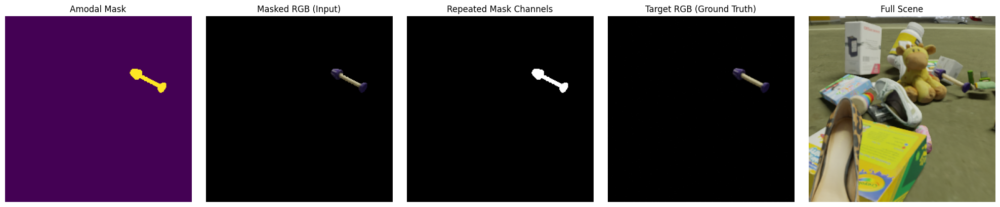


🔍 Index: 6, Frame: 00003, Object: obj_0008


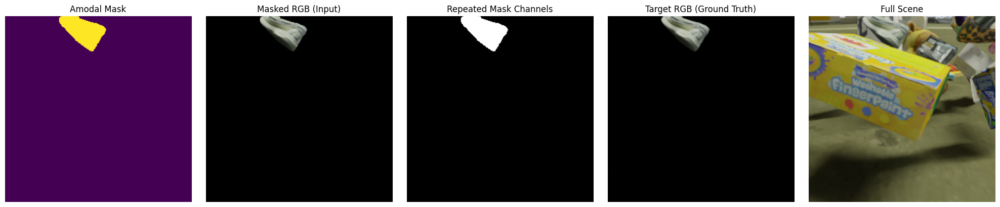


🔍 Index: 7, Frame: 00006, Object: obj_0009


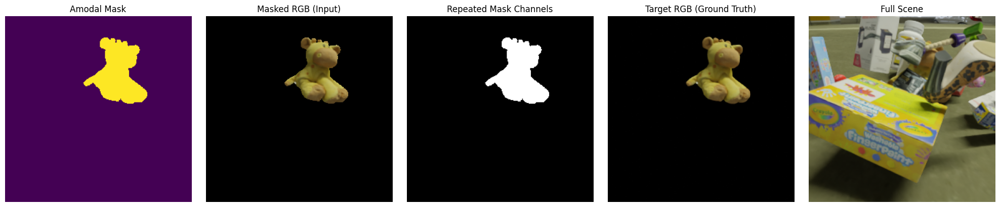


🔍 Index: 8, Frame: 00010, Object: obj_0001


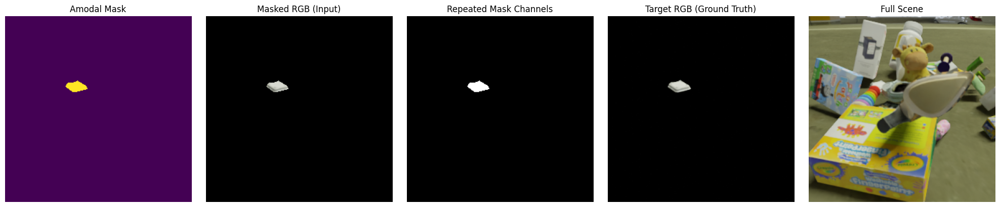


🔍 Index: 9, Frame: 00000, Object: obj_0015


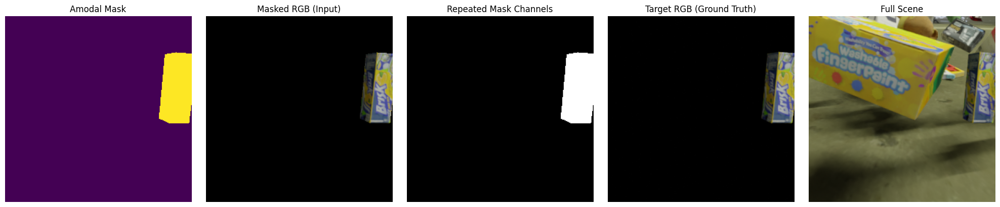


🔍 Index: 10, Frame: 00022, Object: obj_0017


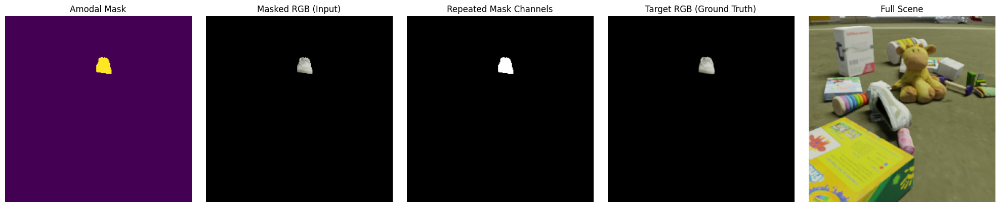


🔍 Index: 11, Frame: 00002, Object: obj_0011


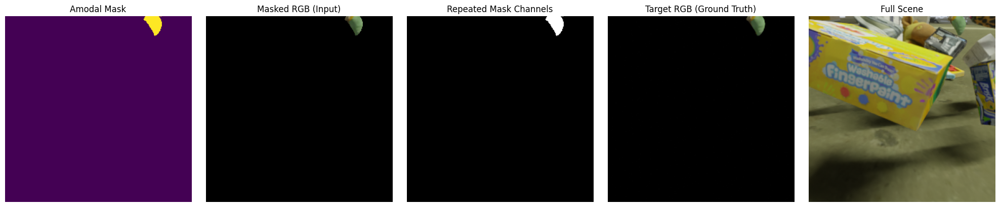


🔍 Index: 12, Frame: 00019, Object: obj_0011


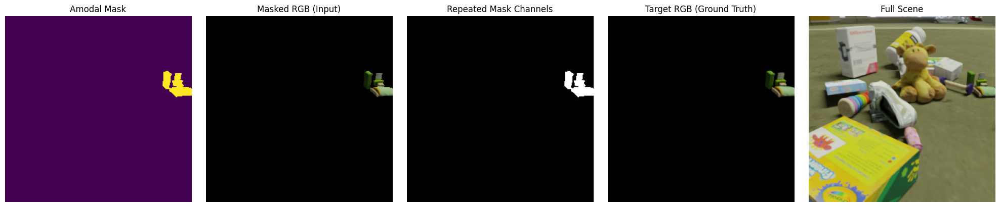


🔍 Index: 13, Frame: 00018, Object: obj_0010


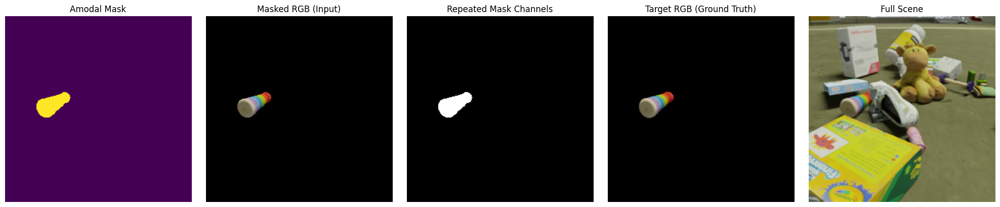


🔍 Index: 14, Frame: 00017, Object: obj_0011


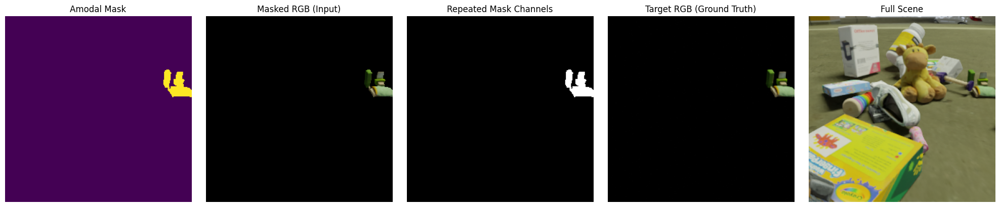


🔍 Index: 15, Frame: 00020, Object: obj_0009


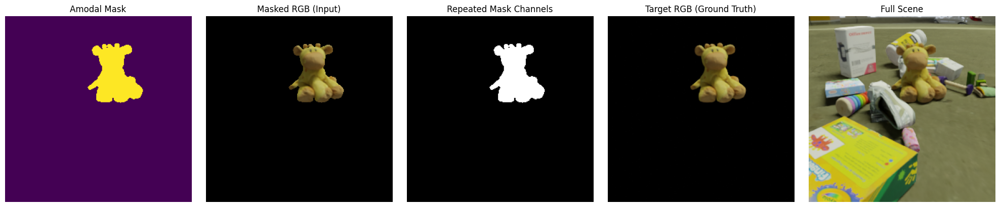


🔍 Index: 16, Frame: 00012, Object: obj_0018


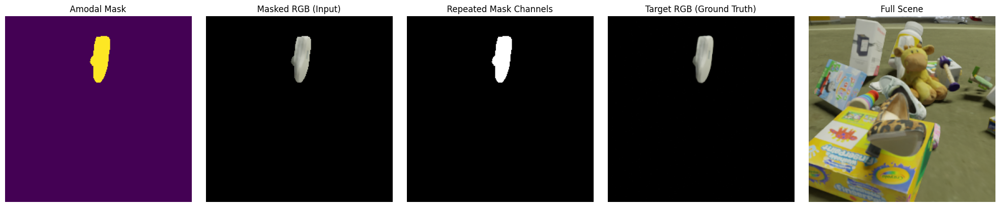


🔍 Index: 17, Frame: 00001, Object: obj_0008


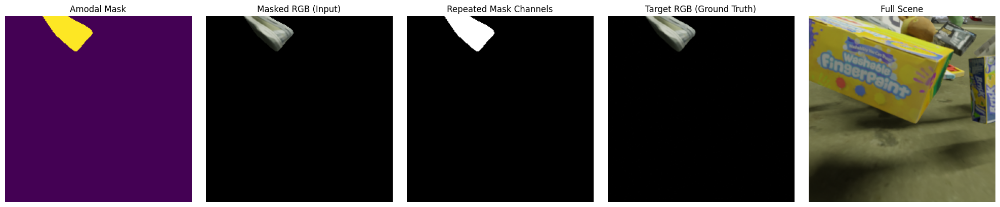


🔍 Index: 18, Frame: 00010, Object: obj_0010


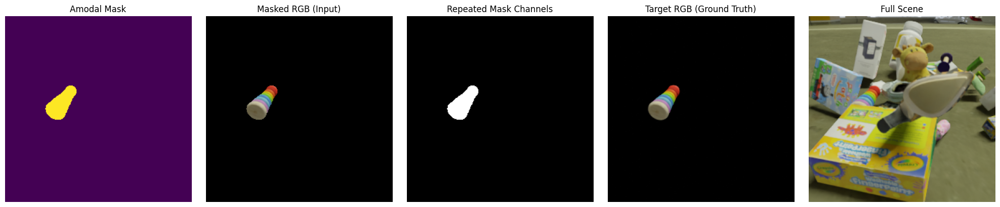


🔍 Index: 19, Frame: 00009, Object: obj_0001


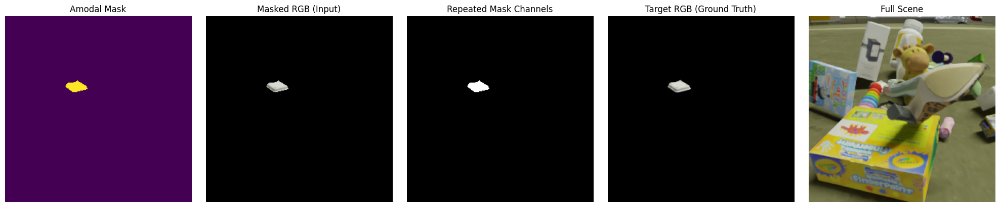


🔍 Index: 20, Frame: 00020, Object: obj_0015


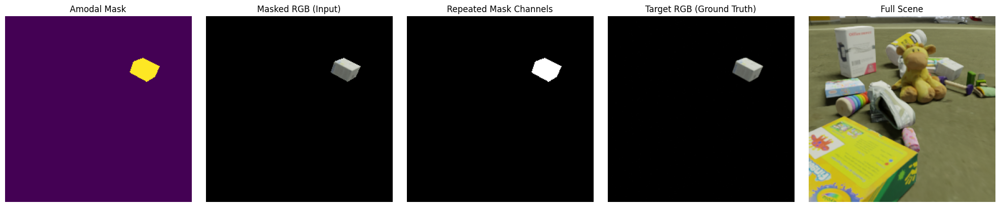


🔍 Index: 21, Frame: 00007, Object: obj_0016


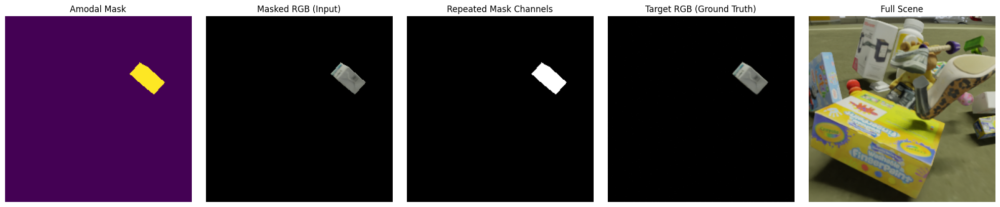


🔍 Index: 22, Frame: 00005, Object: obj_0010


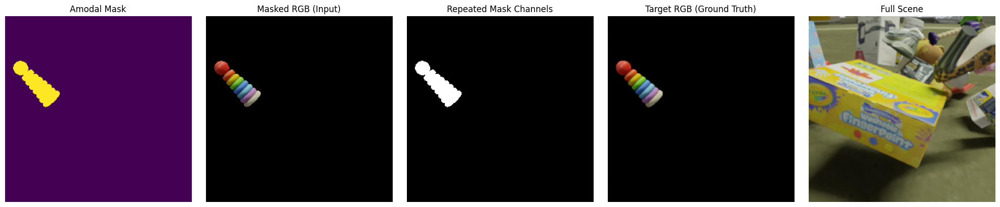


🔍 Index: 23, Frame: 00000, Object: obj_0001


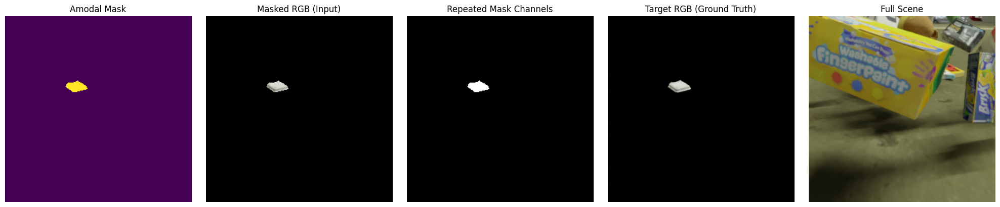

In [ ]:
def find_occluded_samples_with_scene(dataset, start=0, end=20):
    for i in range(start, end):
        input_tensor, target_tensor = dataset[i]
        amodal_mask = input_tensor[0:1]
        masked_rgb = input_tensor[1:4]
        repeated_mask = input_tensor[4:7]
        target_rgb = target_tensor

        # Correct access to underlying dataset
        real_idx = dataset.indices[i]
        sample_info = dataset.dataset.samples[real_idx]
        obj_path = sample_info["object_path"]
        frame_id = sample_info["frame_id"]
        camera_path = obj_path.parent
        full_scene_path = camera_path / f"rgba_{frame_id}.png"

        try:
            full_scene = Image.open(full_scene_path).convert("RGB")
        except FileNotFoundError:
            print(f"🚫 Full scene not found for {full_scene_path}")
            continue

        print(f"\n🔍 Index: {i}, Frame: {frame_id}, Object: {obj_path.name}")

        fig, axs = plt.subplots(1, 5, figsize=(20, 4))

        axs[0].imshow(amodal_mask.squeeze(), cmap="viridis")
        axs[0].set_title("Amodal Mask")

        axs[1].imshow(masked_rgb.permute(1, 2, 0).numpy())
        axs[1].set_title("Masked RGB (Input)")

        axs[2].imshow(repeated_mask.permute(1, 2, 0).numpy())
        axs[2].set_title("Repeated Mask Channels")

        axs[3].imshow(target_rgb.permute(1, 2, 0).numpy())
        axs[3].set_title("Target RGB (Ground Truth)")

        axs[4].imshow(full_scene)
        axs[4].set_title("Full Scene")

        for ax in axs:
            ax.axis("off")
        plt.tight_layout()
        plt.show()

find_occluded_samples_with_scene(test_dataset, start=0, end=24)


In [ ]:
class DoubleConv(nn.Module):
    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.double_conv = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, 3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels, 3, padding=1),
            nn.ReLU(inplace=True),
        )

    def forward(self, x):
        return self.double_conv(x)

class UNet(nn.Module):
    def __init__(self, in_channels=7, out_channels=3):
        super().__init__()
        self.enc1 = DoubleConv(in_channels, 64)
        self.enc2 = DoubleConv(64, 128)
        self.enc3 = DoubleConv(128, 256)
        self.enc4 = DoubleConv(256, 512)

        self.pool = nn.MaxPool2d(2)

        self.bottleneck = DoubleConv(512, 1024)

        self.upconv4 = nn.ConvTranspose2d(1024, 512, 2, stride=2)
        self.dec4 = DoubleConv(1024, 512)
        self.upconv3 = nn.ConvTranspose2d(512, 256, 2, stride=2)
        self.dec3 = DoubleConv(512, 256)
        self.upconv2 = nn.ConvTranspose2d(256, 128, 2, stride=2)
        self.dec2 = DoubleConv(256, 128)
        self.upconv1 = nn.ConvTranspose2d(128, 64, 2, stride=2)
        self.dec1 = DoubleConv(128, 64)

        self.final_conv = nn.Conv2d(64, out_channels, kernel_size=1)

        # Optional: initialize bias to small positive value
        nn.init.constant_(self.final_conv.bias, 0.1)

    def forward(self, x):
        e1 = self.enc1(x)
        e2 = self.enc2(self.pool(e1))
        e3 = self.enc3(self.pool(e2))
        e4 = self.enc4(self.pool(e3))

        b = self.bottleneck(self.pool(e4))

        d4 = self.upconv4(b)
        d4 = self.dec4(torch.cat([d4, e4], dim=1))
        d3 = self.upconv3(d4)
        d3 = self.dec3(torch.cat([d3, e3], dim=1))
        d2 = self.upconv2(d3)
        d2 = self.dec2(torch.cat([d2, e2], dim=1))
        d1 = self.upconv1(d2)
        d1 = self.dec1(torch.cat([d1, e1], dim=1))

        out = self.final_conv(d1)   # Final RGB prediction (3 channels)
        return out  #  correct output


In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Total number of samples
dataset = ModalToAmodalRGBDataset(
    root_dir="/content/ff5da6d6ecae486bb294aeaf5ee8f8a1",
    camera_name="camera_0001"
)

# Split sizes (80% train, 20% test)
train_size = int(0.8 * len(dataset))
test_size = len(dataset) - train_size

# Split
train_dataset, test_dataset = random_split(dataset, [train_size, test_size])

# DataLoaders
train_loader = DataLoader(train_dataset, batch_size=8, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=8, shuffle=False)


model = UNet(in_channels=7, out_channels=3).to(device)
#pos_weight = torch.tensor([100.0]).to(device)  # You can tune 100.0
criterion = nn.MSELoss()
optimizer = optim.Adam(model.parameters(), lr=1e-4)


In [ ]:
x, y = next(iter(train_loader))
print("Input mean:", x.mean().item())
print("Target mean:", y.mean().item())

model.eval()
with torch.no_grad():
    pred = model(x.to(device))
print("Initial pred mean:", pred.mean().item())

print("Final layer weights mean:", model.final_conv.weight.mean().item())

for inputs, targets in train_loader:
    min_val = targets.min().item()
    max_val = targets.max().item()
    in_range = targets.ge(0).all() and targets.le(1).all()

    print("🔍 Target Range Check")
    print(f"→ Min pixel value: {min_val:.6f}")
    print(f"→ Max pixel value: {max_val:.6f}")
    print(f"→ All values in [0, 1]? {' Yes' if in_range else '❌ No'}")
    break  # Remove this line if you want to check more batches


Input mean: 0.045474134385585785
Target mean: 0.03189631924033165
Initial pred mean: 0.0968603789806366
Final layer weights mean: 0.005632615648210049
🔍 Target Range Check
→ Min pixel value: 0.000000
→ Max pixel value: 0.866667
→ All values in [0, 1]?  Yes


In [ ]:
#test

# Set model to evaluation mode and test initial prediction
model.eval()
x, y = next(iter(train_loader))
with torch.no_grad():
    logits = model(x.to(device))  # Output before activation
    pred = torch.relu(logits)     # Apply ReLU activation

print("Initial pred mean:", pred.mean().item())
print(f"Logits mean: {logits.mean().item():.4f}, Logits min: {logits.min().item():.4f}")

# Start training
model.train()
criterion = torch.nn.MSELoss()
epochs = 15

for epoch in range(epochs):
    running_loss = 0.0
    loop = tqdm(train_loader, desc=f"Epoch {epoch+1}/{epochs}", leave=False)

    for batch in loop:
        inputs, targets = batch                # Both from dataset
        inputs = inputs.to(device)             # Shape: [B, 7, H, W]
        targets = targets.to(device)           # Shape: [B, 3, H, W]

        logits = model(inputs)                 # Output before activation: [B, 3, H, W]
        outputs = torch.relu(logits)           # Clamp to [0, ∞)

        loss = criterion(outputs, targets)     # Loss between [B, 3, H, W] tensors

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        running_loss += loss.item()
        loop.set_postfix(loss=loss.item())

        with torch.no_grad():
            print(f"Pred mean: {outputs.mean().item():.4f}, Target mean: {targets.mean().item():.4f}")

    print(f"Epoch {epoch+1} completed. Avg Loss: {running_loss / len(train_loader):.4f}")

# Save model
torch.save(model.state_dict(), "unet_task1_2.pth")
print("Model saved.")


Initial pred mean: 0.09685923904180527
Logits mean: 0.0969, Logits min: 0.0838


Epoch 1/15:   2%|▏         | 1/46 [00:00<00:30,  1.47it/s, loss=0.0133]

Pred mean: 0.0969, Target mean: 0.0128


Epoch 1/15:   4%|▍         | 2/46 [00:01<00:23,  1.87it/s, loss=0.0127]

Pred mean: 0.0940, Target mean: 0.0143


Epoch 1/15:   7%|▋         | 3/46 [00:01<00:20,  2.07it/s, loss=0.012]

Pred mean: 0.0911, Target mean: 0.0112


Epoch 1/15:   9%|▊         | 4/46 [00:01<00:19,  2.20it/s, loss=0.0175]

Pred mean: 0.0888, Target mean: 0.0265


Epoch 1/15:  11%|█         | 5/46 [00:02<00:18,  2.27it/s, loss=0.0115]

Pred mean: 0.0861, Target mean: 0.0127


Epoch 1/15:  13%|█▎        | 6/46 [00:02<00:17,  2.31it/s, loss=0.0181]

Pred mean: 0.0844, Target mean: 0.0324


Epoch 1/15:  15%|█▌        | 7/46 [00:03<00:16,  2.34it/s, loss=0.0139]

Pred mean: 0.0819, Target mean: 0.0245


Epoch 1/15:  17%|█▋        | 8/46 [00:03<00:16,  2.36it/s, loss=0.00835]

Pred mean: 0.0788, Target mean: 0.0101


Epoch 1/15:  20%|█▉        | 9/46 [00:04<00:15,  2.37it/s, loss=0.00845]

Pred mean: 0.0761, Target mean: 0.0098


Epoch 1/15:  22%|██▏       | 10/46 [00:04<00:15,  2.38it/s, loss=0.0104]

Pred mean: 0.0739, Target mean: 0.0162


Epoch 1/15:  24%|██▍       | 11/46 [00:04<00:14,  2.35it/s, loss=0.0102]

Pred mean: 0.0713, Target mean: 0.0178


Epoch 1/15:  26%|██▌       | 12/46 [00:05<00:15,  2.21it/s, loss=0.0072]

Pred mean: 0.0676, Target mean: 0.0104


Epoch 1/15:  28%|██▊       | 13/46 [00:05<00:14,  2.26it/s, loss=0.0123]

Pred mean: 0.0659, Target mean: 0.0222


Epoch 1/15:  30%|███       | 14/46 [00:06<00:13,  2.30it/s, loss=0.0126]

Pred mean: 0.0634, Target mean: 0.0234


Epoch 1/15:  33%|███▎      | 15/46 [00:06<00:13,  2.32it/s, loss=0.00813]

Pred mean: 0.0605, Target mean: 0.0174


Epoch 1/15:  35%|███▍      | 16/46 [00:07<00:12,  2.32it/s, loss=0.00725]

Pred mean: 0.0567, Target mean: 0.0134


Epoch 1/15:  37%|███▋      | 17/46 [00:07<00:12,  2.32it/s, loss=0.0103]

Pred mean: 0.0567, Target mean: 0.0266


Epoch 1/15:  39%|███▉      | 18/46 [00:07<00:12,  2.32it/s, loss=0.00967]

Pred mean: 0.0547, Target mean: 0.0285


Epoch 1/15:  41%|████▏     | 19/46 [00:08<00:11,  2.31it/s, loss=0.00395]

Pred mean: 0.0462, Target mean: 0.0087


Epoch 1/15:  43%|████▎     | 20/46 [00:08<00:11,  2.31it/s, loss=0.00545]

Pred mean: 0.0453, Target mean: 0.0178


Epoch 1/15:  46%|████▌     | 21/46 [00:09<00:10,  2.33it/s, loss=0.00485]

Pred mean: 0.0409, Target mean: 0.0174


Epoch 1/15:  48%|████▊     | 22/46 [00:09<00:10,  2.34it/s, loss=0.0122]

Pred mean: 0.0461, Target mean: 0.0451


Epoch 1/15:  50%|█████     | 23/46 [00:10<00:09,  2.35it/s, loss=0.00252]

Pred mean: 0.0271, Target mean: 0.0090


Epoch 1/15:  52%|█████▏    | 24/46 [00:10<00:09,  2.36it/s, loss=0.00406]

Pred mean: 0.0274, Target mean: 0.0193


Epoch 1/15:  54%|█████▍    | 25/46 [00:10<00:08,  2.37it/s, loss=0.00567]

Pred mean: 0.0280, Target mean: 0.0292


Epoch 1/15:  57%|█████▋    | 26/46 [00:11<00:08,  2.37it/s, loss=0.0078]

Pred mean: 0.0329, Target mean: 0.0462


Epoch 1/15:  59%|█████▊    | 27/46 [00:11<00:08,  2.37it/s, loss=0.00133]

Pred mean: 0.0078, Target mean: 0.0104


Epoch 1/15:  61%|██████    | 28/46 [00:12<00:07,  2.39it/s, loss=0.00187]

Pred mean: 0.0130, Target mean: 0.0172


Epoch 1/15:  63%|██████▎   | 29/46 [00:12<00:07,  2.40it/s, loss=0.000922]

Pred mean: 0.0067, Target mean: 0.0099


Epoch 1/15:  65%|██████▌   | 30/46 [00:12<00:06,  2.41it/s, loss=0.00128]

Pred mean: 0.0139, Target mean: 0.0162


Epoch 1/15:  67%|██████▋   | 31/46 [00:13<00:06,  2.41it/s, loss=0.000595]

Pred mean: 0.0071, Target mean: 0.0090


Epoch 1/15:  70%|██████▉   | 32/46 [00:13<00:05,  2.42it/s, loss=0.000977]

Pred mean: 0.0107, Target mean: 0.0122


Epoch 1/15:  72%|███████▏  | 33/46 [00:14<00:05,  2.42it/s, loss=0.000822]

Pred mean: 0.0089, Target mean: 0.0102


Epoch 1/15:  74%|███████▍  | 34/46 [00:14<00:04,  2.42it/s, loss=0.00202]

Pred mean: 0.0298, Target mean: 0.0300


Epoch 1/15:  76%|███████▌  | 35/46 [00:15<00:04,  2.41it/s, loss=0.00291]

Pred mean: 0.0449, Target mean: 0.0441


Epoch 1/15:  78%|███████▊  | 36/46 [00:15<00:04,  2.41it/s, loss=0.00182]

Pred mean: 0.0240, Target mean: 0.0233


Epoch 1/15:  80%|████████  | 37/46 [00:15<00:03,  2.41it/s, loss=0.00125]

Pred mean: 0.0171, Target mean: 0.0163


Epoch 1/15:  83%|████████▎ | 38/46 [00:16<00:03,  2.42it/s, loss=0.000921]

Pred mean: 0.0147, Target mean: 0.0143


Epoch 1/15:  85%|████████▍ | 39/46 [00:16<00:02,  2.42it/s, loss=0.000797]

Pred mean: 0.0089, Target mean: 0.0092


Epoch 1/15:  87%|████████▋ | 40/46 [00:17<00:02,  2.43it/s, loss=0.00247]

Pred mean: 0.0375, Target mean: 0.0339


Epoch 1/15:  89%|████████▉ | 41/46 [00:17<00:02,  2.43it/s, loss=0.00156]

Pred mean: 0.0138, Target mean: 0.0125


Epoch 1/15:  91%|█████████▏| 42/46 [00:17<00:01,  2.43it/s, loss=0.00195]

Pred mean: 0.0241, Target mean: 0.0224


Epoch 1/15:  93%|█████████▎| 43/46 [00:18<00:01,  2.43it/s, loss=0.00109]

Pred mean: 0.0113, Target mean: 0.0122


Epoch 1/15:  96%|█████████▌| 44/46 [00:18<00:00,  2.43it/s, loss=0.00254]

Pred mean: 0.0361, Target mean: 0.0324


Epoch 1/15:  98%|█████████▊| 45/46 [00:19<00:00,  2.41it/s, loss=0.00201]

Pred mean: 0.0290, Target mean: 0.0312


Pred mean: 0.0127, Target mean: 0.0108
Epoch 1 completed. Avg Loss: 0.0061


Epoch 2/15:   2%|▏         | 1/46 [00:00<00:19,  2.34it/s, loss=0.000804]

Pred mean: 0.0084, Target mean: 0.0081


Epoch 2/15:   4%|▍         | 2/46 [00:00<00:18,  2.35it/s, loss=0.00082]

Pred mean: 0.0112, Target mean: 0.0145


Epoch 2/15:   7%|▋         | 3/46 [00:01<00:18,  2.34it/s, loss=0.00186]

Pred mean: 0.0237, Target mean: 0.0267


Epoch 2/15:   9%|▊         | 4/46 [00:01<00:17,  2.34it/s, loss=0.000932]

Pred mean: 0.0105, Target mean: 0.0125


Epoch 2/15:  11%|█         | 5/46 [00:02<00:17,  2.37it/s, loss=0.000881]

Pred mean: 0.0096, Target mean: 0.0125


Epoch 2/15:  13%|█▎        | 6/46 [00:02<00:16,  2.38it/s, loss=0.00344]

Pred mean: 0.0362, Target mean: 0.0434


Epoch 2/15:  15%|█▌        | 7/46 [00:02<00:16,  2.39it/s, loss=0.000778]

Pred mean: 0.0091, Target mean: 0.0125


Epoch 2/15:  17%|█▋        | 8/46 [00:03<00:15,  2.40it/s, loss=0.00175]

Pred mean: 0.0240, Target mean: 0.0278


Epoch 2/15:  20%|█▉        | 9/46 [00:03<00:15,  2.41it/s, loss=0.000565]

Pred mean: 0.0071, Target mean: 0.0099


Epoch 2/15:  22%|██▏       | 10/46 [00:04<00:14,  2.41it/s, loss=0.000655]

Pred mean: 0.0075, Target mean: 0.0091


Epoch 2/15:  24%|██▍       | 11/46 [00:04<00:14,  2.41it/s, loss=0.000552]

Pred mean: 0.0071, Target mean: 0.0086


Epoch 2/15:  26%|██▌       | 12/46 [00:05<00:14,  2.40it/s, loss=0.00344]

Pred mean: 0.0473, Target mean: 0.0510


Epoch 2/15:  28%|██▊       | 13/46 [00:05<00:13,  2.41it/s, loss=0.000729]

Pred mean: 0.0113, Target mean: 0.0142


Epoch 2/15:  30%|███       | 14/46 [00:05<00:13,  2.41it/s, loss=0.00185]

Pred mean: 0.0265, Target mean: 0.0279


Epoch 2/15:  33%|███▎      | 15/46 [00:06<00:12,  2.41it/s, loss=0.000614]

Pred mean: 0.0082, Target mean: 0.0097


Epoch 2/15:  35%|███▍      | 16/46 [00:06<00:12,  2.41it/s, loss=0.00217]

Pred mean: 0.0315, Target mean: 0.0289


Epoch 2/15:  37%|███▋      | 17/46 [00:07<00:12,  2.40it/s, loss=0.00292]

Pred mean: 0.0421, Target mean: 0.0398


Epoch 2/15:  39%|███▉      | 18/46 [00:07<00:11,  2.41it/s, loss=0.000402]

Pred mean: 0.0049, Target mean: 0.0054


Epoch 2/15:  41%|████▏     | 19/46 [00:07<00:11,  2.41it/s, loss=0.000528]

Pred mean: 0.0079, Target mean: 0.0091


Epoch 2/15:  43%|████▎     | 20/46 [00:08<00:10,  2.41it/s, loss=0.00064]

Pred mean: 0.0095, Target mean: 0.0099


Epoch 2/15:  46%|████▌     | 21/46 [00:08<00:10,  2.41it/s, loss=0.00183]

Pred mean: 0.0325, Target mean: 0.0301


Epoch 2/15:  48%|████▊     | 22/46 [00:09<00:09,  2.41it/s, loss=0.0011]

Pred mean: 0.0148, Target mean: 0.0151


Epoch 2/15:  50%|█████     | 23/46 [00:09<00:09,  2.41it/s, loss=0.00099]

Pred mean: 0.0180, Target mean: 0.0194


Epoch 2/15:  52%|█████▏    | 24/46 [00:10<00:09,  2.41it/s, loss=0.000569]

Pred mean: 0.0095, Target mean: 0.0111


Epoch 2/15:  54%|█████▍    | 25/46 [00:10<00:08,  2.38it/s, loss=0.002]

Pred mean: 0.0319, Target mean: 0.0346


Epoch 2/15:  57%|█████▋    | 26/46 [00:10<00:08,  2.23it/s, loss=0.000778]

Pred mean: 0.0112, Target mean: 0.0144


Epoch 2/15:  59%|█████▊    | 27/46 [00:11<00:08,  2.28it/s, loss=0.00192]

Pred mean: 0.0274, Target mean: 0.0309


Epoch 2/15:  61%|██████    | 28/46 [00:11<00:07,  2.31it/s, loss=0.00218]

Pred mean: 0.0286, Target mean: 0.0334


Epoch 2/15:  63%|██████▎   | 29/46 [00:12<00:07,  2.30it/s, loss=0.00107]

Pred mean: 0.0173, Target mean: 0.0196


Epoch 2/15:  65%|██████▌   | 30/46 [00:12<00:07,  2.15it/s, loss=0.000626]

Pred mean: 0.0119, Target mean: 0.0131


Epoch 2/15:  67%|██████▋   | 31/46 [00:13<00:06,  2.20it/s, loss=0.000484]

Pred mean: 0.0069, Target mean: 0.0092


Epoch 2/15:  70%|██████▉   | 32/46 [00:13<00:06,  2.22it/s, loss=0.000659]

Pred mean: 0.0133, Target mean: 0.0140


Epoch 2/15:  72%|███████▏  | 33/46 [00:14<00:05,  2.26it/s, loss=0.000716]

Pred mean: 0.0163, Target mean: 0.0156


Epoch 2/15:  74%|███████▍  | 34/46 [00:14<00:05,  2.30it/s, loss=0.0013]

Pred mean: 0.0225, Target mean: 0.0249


Epoch 2/15:  76%|███████▌  | 35/46 [00:14<00:04,  2.33it/s, loss=0.000461]

Pred mean: 0.0092, Target mean: 0.0098


Epoch 2/15:  78%|███████▊  | 36/46 [00:15<00:04,  2.34it/s, loss=0.00135]

Pred mean: 0.0273, Target mean: 0.0266


Epoch 2/15:  80%|████████  | 37/46 [00:15<00:03,  2.37it/s, loss=0.000372]

Pred mean: 0.0063, Target mean: 0.0081


Epoch 2/15:  83%|████████▎ | 38/46 [00:16<00:03,  2.38it/s, loss=0.000716]

Pred mean: 0.0128, Target mean: 0.0137


Epoch 2/15:  85%|████████▍ | 39/46 [00:16<00:02,  2.38it/s, loss=0.00154]

Pred mean: 0.0252, Target mean: 0.0284


Epoch 2/15:  87%|████████▋ | 40/46 [00:16<00:02,  2.38it/s, loss=0.000458]

Pred mean: 0.0078, Target mean: 0.0094


Epoch 2/15:  89%|████████▉ | 41/46 [00:17<00:02,  2.39it/s, loss=0.000225]

Pred mean: 0.0074, Target mean: 0.0088


Epoch 2/15:  91%|█████████▏| 42/46 [00:17<00:01,  2.38it/s, loss=0.00151]

Pred mean: 0.0377, Target mean: 0.0388


Epoch 2/15:  93%|█████████▎| 43/46 [00:18<00:01,  2.39it/s, loss=0.000563]

Pred mean: 0.0158, Target mean: 0.0187


Epoch 2/15:  96%|█████████▌| 44/46 [00:18<00:00,  2.38it/s, loss=0.000422]

Pred mean: 0.0105, Target mean: 0.0121


Epoch 2/15:  98%|█████████▊| 45/46 [00:19<00:00,  2.37it/s, loss=0.00203]

Pred mean: 0.0421, Target mean: 0.0446


Pred mean: 0.0174, Target mean: 0.0185
Epoch 2 completed. Avg Loss: 0.0011


Epoch 3/15:   2%|▏         | 1/46 [00:00<00:18,  2.39it/s, loss=0.000279]

Pred mean: 0.0060, Target mean: 0.0079


Epoch 3/15:   4%|▍         | 2/46 [00:00<00:18,  2.39it/s, loss=0.00125]

Pred mean: 0.0257, Target mean: 0.0262


Epoch 3/15:   7%|▋         | 3/46 [00:01<00:17,  2.39it/s, loss=0.000303]

Pred mean: 0.0078, Target mean: 0.0088


Epoch 3/15:   9%|▊         | 4/46 [00:01<00:17,  2.39it/s, loss=0.000327]

Pred mean: 0.0093, Target mean: 0.0101


Epoch 3/15:  11%|█         | 5/46 [00:02<00:17,  2.39it/s, loss=0.000442]

Pred mean: 0.0152, Target mean: 0.0162


Epoch 3/15:  13%|█▎        | 6/46 [00:02<00:16,  2.39it/s, loss=0.000301]

Pred mean: 0.0131, Target mean: 0.0147


Epoch 3/15:  15%|█▌        | 7/46 [00:02<00:16,  2.38it/s, loss=0.00121]

Pred mean: 0.0232, Target mean: 0.0262


Epoch 3/15:  17%|█▋        | 8/46 [00:03<00:16,  2.37it/s, loss=0.000485]

Pred mean: 0.0119, Target mean: 0.0144


Epoch 3/15:  20%|█▉        | 9/46 [00:03<00:15,  2.37it/s, loss=0.00107]

Pred mean: 0.0210, Target mean: 0.0237


Epoch 3/15:  22%|██▏       | 10/46 [00:04<00:15,  2.37it/s, loss=0.000955]

Pred mean: 0.0265, Target mean: 0.0283


Epoch 3/15:  24%|██▍       | 11/46 [00:04<00:14,  2.36it/s, loss=0.00054]

Pred mean: 0.0166, Target mean: 0.0182


Epoch 3/15:  26%|██▌       | 12/46 [00:05<00:14,  2.33it/s, loss=0.00112]

Pred mean: 0.0284, Target mean: 0.0289


Epoch 3/15:  28%|██▊       | 13/46 [00:05<00:14,  2.32it/s, loss=0.000465]

Pred mean: 0.0154, Target mean: 0.0165


Epoch 3/15:  30%|███       | 14/46 [00:05<00:13,  2.32it/s, loss=0.000158]

Pred mean: 0.0043, Target mean: 0.0059


Epoch 3/15:  33%|███▎      | 15/46 [00:06<00:13,  2.30it/s, loss=0.000839]

Pred mean: 0.0248, Target mean: 0.0261


Epoch 3/15:  35%|███▍      | 16/46 [00:06<00:12,  2.32it/s, loss=0.000337]

Pred mean: 0.0133, Target mean: 0.0152


Epoch 3/15:  37%|███▋      | 17/46 [00:07<00:12,  2.34it/s, loss=0.000358]

Pred mean: 0.0119, Target mean: 0.0140


Epoch 3/15:  39%|███▉      | 18/46 [00:07<00:11,  2.34it/s, loss=0.000318]

Pred mean: 0.0109, Target mean: 0.0133


Epoch 3/15:  41%|████▏     | 19/46 [00:08<00:11,  2.34it/s, loss=0.000328]

Pred mean: 0.0138, Target mean: 0.0164


Epoch 3/15:  43%|████▎     | 20/46 [00:08<00:11,  2.35it/s, loss=0.000258]

Pred mean: 0.0069, Target mean: 0.0088


Epoch 3/15:  46%|████▌     | 21/46 [00:08<00:10,  2.35it/s, loss=0.000314]

Pred mean: 0.0162, Target mean: 0.0176


Epoch 3/15:  48%|████▊     | 22/46 [00:09<00:10,  2.35it/s, loss=0.00118]

Pred mean: 0.0257, Target mean: 0.0264


Epoch 3/15:  50%|█████     | 23/46 [00:09<00:09,  2.35it/s, loss=0.00183]

Pred mean: 0.0420, Target mean: 0.0419


Epoch 3/15:  52%|█████▏    | 24/46 [00:10<00:09,  2.35it/s, loss=0.000215]

Pred mean: 0.0107, Target mean: 0.0125


Epoch 3/15:  54%|█████▍    | 25/46 [00:10<00:08,  2.34it/s, loss=0.000244]

Pred mean: 0.0083, Target mean: 0.0102


Epoch 3/15:  57%|█████▋    | 26/46 [00:11<00:08,  2.34it/s, loss=0.000305]

Pred mean: 0.0134, Target mean: 0.0158


Epoch 3/15:  59%|█████▊    | 27/46 [00:11<00:08,  2.34it/s, loss=0.00113]

Pred mean: 0.0241, Target mean: 0.0268


Epoch 3/15:  61%|██████    | 28/46 [00:11<00:07,  2.33it/s, loss=0.000791]

Pred mean: 0.0246, Target mean: 0.0267


Epoch 3/15:  63%|██████▎   | 29/46 [00:12<00:07,  2.34it/s, loss=0.000318]

Pred mean: 0.0109, Target mean: 0.0125


Epoch 3/15:  65%|██████▌   | 30/46 [00:12<00:06,  2.34it/s, loss=0.000392]

Pred mean: 0.0144, Target mean: 0.0156


Epoch 3/15:  67%|██████▋   | 31/46 [00:13<00:06,  2.34it/s, loss=0.00108]

Pred mean: 0.0308, Target mean: 0.0304


Epoch 3/15:  70%|██████▉   | 32/46 [00:13<00:05,  2.34it/s, loss=0.000939]

Pred mean: 0.0222, Target mean: 0.0230


Epoch 3/15:  72%|███████▏  | 33/46 [00:14<00:05,  2.34it/s, loss=0.000793]

Pred mean: 0.0214, Target mean: 0.0229


Epoch 3/15:  74%|███████▍  | 34/46 [00:14<00:05,  2.34it/s, loss=0.000316]

Pred mean: 0.0145, Target mean: 0.0167


Epoch 3/15:  76%|███████▌  | 35/46 [00:14<00:04,  2.34it/s, loss=0.00093]

Pred mean: 0.0202, Target mean: 0.0230


Epoch 3/15:  78%|███████▊  | 36/46 [00:15<00:04,  2.33it/s, loss=0.000251]

Pred mean: 0.0067, Target mean: 0.0087


Epoch 3/15:  80%|████████  | 37/46 [00:15<00:03,  2.33it/s, loss=0.000908]

Pred mean: 0.0272, Target mean: 0.0300


Epoch 3/15:  83%|████████▎ | 38/46 [00:16<00:03,  2.33it/s, loss=0.000941]

Pred mean: 0.0281, Target mean: 0.0299


Epoch 3/15:  85%|████████▍ | 39/46 [00:16<00:03,  2.33it/s, loss=0.00084]

Pred mean: 0.0253, Target mean: 0.0263


Epoch 3/15:  87%|████████▋ | 40/46 [00:17<00:02,  2.31it/s, loss=0.00084]

Pred mean: 0.0270, Target mean: 0.0277


Epoch 3/15:  89%|████████▉ | 41/46 [00:17<00:02,  2.31it/s, loss=0.000563]

Pred mean: 0.0185, Target mean: 0.0198


Epoch 3/15:  91%|█████████▏| 42/46 [00:17<00:01,  2.29it/s, loss=0.000326]

Pred mean: 0.0176, Target mean: 0.0188


Epoch 3/15:  93%|█████████▎| 43/46 [00:18<00:01,  2.28it/s, loss=0.000346]

Pred mean: 0.0173, Target mean: 0.0192


Epoch 3/15:  96%|█████████▌| 44/46 [00:18<00:00,  2.28it/s, loss=0.00109]

Pred mean: 0.0313, Target mean: 0.0336


Epoch 3/15:  98%|█████████▊| 45/46 [00:19<00:00,  2.29it/s, loss=0.000278]

Pred mean: 0.0130, Target mean: 0.0149


Pred mean: 0.0071, Target mean: 0.0088
Epoch 3 completed. Avg Loss: 0.0006


Epoch 4/15:   2%|▏         | 1/46 [00:00<00:19,  2.34it/s, loss=0.000245]

Pred mean: 0.0105, Target mean: 0.0123


Epoch 4/15:   4%|▍         | 2/46 [00:00<00:18,  2.33it/s, loss=0.000271]

Pred mean: 0.0171, Target mean: 0.0186


Epoch 4/15:   7%|▋         | 3/46 [00:01<00:18,  2.33it/s, loss=0.000232]

Pred mean: 0.0146, Target mean: 0.0160


Epoch 4/15:   9%|▊         | 4/46 [00:01<00:18,  2.31it/s, loss=0.000248]

Pred mean: 0.0088, Target mean: 0.0103


Epoch 4/15:  11%|█         | 5/46 [00:02<00:17,  2.30it/s, loss=0.00024]

Pred mean: 0.0117, Target mean: 0.0133


Epoch 4/15:  13%|█▎        | 6/46 [00:02<00:17,  2.31it/s, loss=0.00018]

Pred mean: 0.0128, Target mean: 0.0144


Epoch 4/15:  15%|█▌        | 7/46 [00:03<00:16,  2.31it/s, loss=0.000387]

Pred mean: 0.0117, Target mean: 0.0133


Epoch 4/15:  17%|█▋        | 8/46 [00:03<00:16,  2.32it/s, loss=0.00114]

Pred mean: 0.0250, Target mean: 0.0263


Epoch 4/15:  20%|█▉        | 9/46 [00:03<00:15,  2.32it/s, loss=0.00026]

Pred mean: 0.0131, Target mean: 0.0149


Epoch 4/15:  22%|██▏       | 10/46 [00:04<00:15,  2.32it/s, loss=0.000141]

Pred mean: 0.0082, Target mean: 0.0100


Epoch 4/15:  24%|██▍       | 11/46 [00:04<00:15,  2.32it/s, loss=0.000765]

Pred mean: 0.0270, Target mean: 0.0289


Epoch 4/15:  26%|██▌       | 12/46 [00:05<00:14,  2.32it/s, loss=0.000191]

Pred mean: 0.0125, Target mean: 0.0142


Epoch 4/15:  28%|██▊       | 13/46 [00:05<00:14,  2.31it/s, loss=0.00096]

Pred mean: 0.0269, Target mean: 0.0279


Epoch 4/15:  30%|███       | 14/46 [00:06<00:13,  2.31it/s, loss=0.000894]

Pred mean: 0.0257, Target mean: 0.0268


Epoch 4/15:  33%|███▎      | 15/46 [00:06<00:13,  2.31it/s, loss=0.000248]

Pred mean: 0.0109, Target mean: 0.0130


Epoch 4/15:  35%|███▍      | 16/46 [00:06<00:13,  2.30it/s, loss=0.000277]

Pred mean: 0.0109, Target mean: 0.0127


Epoch 4/15:  37%|███▋      | 17/46 [00:07<00:12,  2.30it/s, loss=0.000761]

Pred mean: 0.0229, Target mean: 0.0248


Epoch 4/15:  39%|███▉      | 18/46 [00:07<00:12,  2.30it/s, loss=0.000443]

Pred mean: 0.0133, Target mean: 0.0152


Epoch 4/15:  41%|████▏     | 19/46 [00:08<00:11,  2.30it/s, loss=0.000792]

Pred mean: 0.0302, Target mean: 0.0319


Epoch 4/15:  43%|████▎     | 20/46 [00:08<00:11,  2.30it/s, loss=0.000261]

Pred mean: 0.0114, Target mean: 0.0130


Epoch 4/15:  46%|████▌     | 21/46 [00:09<00:10,  2.30it/s, loss=0.000373]

Pred mean: 0.0133, Target mean: 0.0149


Epoch 4/15:  48%|████▊     | 22/46 [00:09<00:10,  2.28it/s, loss=0.000143]

Pred mean: 0.0049, Target mean: 0.0066


Epoch 4/15:  50%|█████     | 23/46 [00:10<00:10,  2.24it/s, loss=0.000785]

Pred mean: 0.0252, Target mean: 0.0265


Epoch 4/15:  52%|█████▏    | 24/46 [00:10<00:09,  2.24it/s, loss=0.00118]

Pred mean: 0.0439, Target mean: 0.0456


Epoch 4/15:  54%|█████▍    | 25/46 [00:10<00:09,  2.24it/s, loss=0.000201]

Pred mean: 0.0109, Target mean: 0.0127


Epoch 4/15:  57%|█████▋    | 26/46 [00:11<00:08,  2.24it/s, loss=0.000184]

Pred mean: 0.0097, Target mean: 0.0114


Epoch 4/15:  59%|█████▊    | 27/46 [00:11<00:08,  2.25it/s, loss=0.000558]

Pred mean: 0.0239, Target mean: 0.0257


Epoch 4/15:  61%|██████    | 28/46 [00:12<00:07,  2.26it/s, loss=0.000194]

Pred mean: 0.0142, Target mean: 0.0158


Epoch 4/15:  63%|██████▎   | 29/46 [00:12<00:07,  2.27it/s, loss=0.000147]

Pred mean: 0.0086, Target mean: 0.0102


Epoch 4/15:  65%|██████▌   | 30/46 [00:13<00:07,  2.28it/s, loss=0.000242]

Pred mean: 0.0152, Target mean: 0.0165


Epoch 4/15:  67%|██████▋   | 31/46 [00:13<00:06,  2.29it/s, loss=0.000163]

Pred mean: 0.0098, Target mean: 0.0113


Epoch 4/15:  70%|██████▉   | 32/46 [00:13<00:06,  2.29it/s, loss=0.000619]

Pred mean: 0.0252, Target mean: 0.0263


Epoch 4/15:  72%|███████▏  | 33/46 [00:14<00:05,  2.29it/s, loss=0.000732]

Pred mean: 0.0245, Target mean: 0.0261


Epoch 4/15:  74%|███████▍  | 34/46 [00:14<00:05,  2.29it/s, loss=0.000199]

Pred mean: 0.0106, Target mean: 0.0124


Epoch 4/15:  76%|███████▌  | 35/46 [00:15<00:04,  2.29it/s, loss=0.000154]

Pred mean: 0.0068, Target mean: 0.0086


Epoch 4/15:  78%|███████▊  | 36/46 [00:15<00:04,  2.29it/s, loss=0.000681]

Pred mean: 0.0263, Target mean: 0.0283


Epoch 4/15:  80%|████████  | 37/46 [00:16<00:03,  2.29it/s, loss=0.000261]

Pred mean: 0.0147, Target mean: 0.0164


Epoch 4/15:  83%|████████▎ | 38/46 [00:16<00:03,  2.29it/s, loss=0.00019]

Pred mean: 0.0116, Target mean: 0.0131


Epoch 4/15:  85%|████████▍ | 39/46 [00:17<00:03,  2.28it/s, loss=0.00106]

Pred mean: 0.0437, Target mean: 0.0443


Epoch 4/15:  87%|████████▋ | 40/46 [00:17<00:02,  2.28it/s, loss=0.000146]

Pred mean: 0.0110, Target mean: 0.0128


Epoch 4/15:  89%|████████▉ | 41/46 [00:17<00:02,  2.27it/s, loss=0.000553]

Pred mean: 0.0245, Target mean: 0.0267


Epoch 4/15:  91%|█████████▏| 42/46 [00:18<00:01,  2.27it/s, loss=0.000906]

Pred mean: 0.0436, Target mean: 0.0460


Epoch 4/15:  93%|█████████▎| 43/46 [00:18<00:01,  2.26it/s, loss=0.000496]

Pred mean: 0.0253, Target mean: 0.0266


Epoch 4/15:  96%|█████████▌| 44/46 [00:19<00:00,  2.27it/s, loss=0.000497]

Pred mean: 0.0241, Target mean: 0.0252


Epoch 4/15:  98%|█████████▊| 45/46 [00:19<00:00,  2.27it/s, loss=0.000247]

Pred mean: 0.0147, Target mean: 0.0159


Pred mean: 0.0221, Target mean: 0.0233
Epoch 4 completed. Avg Loss: 0.0004


Epoch 5/15:   2%|▏         | 1/46 [00:00<00:20,  2.24it/s, loss=0.000471]

Pred mean: 0.0243, Target mean: 0.0259


Epoch 5/15:   4%|▍         | 2/46 [00:00<00:19,  2.25it/s, loss=0.000397]

Pred mean: 0.0272, Target mean: 0.0296


Epoch 5/15:   7%|▋         | 3/46 [00:01<00:19,  2.23it/s, loss=0.000441]

Pred mean: 0.0252, Target mean: 0.0271


Epoch 5/15:   9%|▊         | 4/46 [00:01<00:18,  2.22it/s, loss=0.000237]

Pred mean: 0.0203, Target mean: 0.0221


Epoch 5/15:  11%|█         | 5/46 [00:02<00:18,  2.22it/s, loss=0.000445]

Pred mean: 0.0238, Target mean: 0.0250


Epoch 5/15:  13%|█▎        | 6/46 [00:02<00:18,  2.21it/s, loss=0.000179]

Pred mean: 0.0161, Target mean: 0.0173


Epoch 5/15:  15%|█▌        | 7/46 [00:03<00:17,  2.23it/s, loss=0.000168]

Pred mean: 0.0136, Target mean: 0.0150


Epoch 5/15:  17%|█▋        | 8/46 [00:03<00:17,  2.23it/s, loss=0.000101]

Pred mean: 0.0103, Target mean: 0.0120


Epoch 5/15:  20%|█▉        | 9/46 [00:04<00:16,  2.24it/s, loss=9.33e-5]

Pred mean: 0.0060, Target mean: 0.0077


Epoch 5/15:  22%|██▏       | 10/46 [00:04<00:16,  2.24it/s, loss=0.000415]

Pred mean: 0.0277, Target mean: 0.0299


Epoch 5/15:  24%|██▍       | 11/46 [00:04<00:15,  2.25it/s, loss=0.000128]

Pred mean: 0.0073, Target mean: 0.0090


Epoch 5/15:  26%|██▌       | 12/46 [00:05<00:15,  2.25it/s, loss=0.000155]

Pred mean: 0.0136, Target mean: 0.0154


Epoch 5/15:  28%|██▊       | 13/46 [00:05<00:14,  2.25it/s, loss=0.00012]

Pred mean: 0.0100, Target mean: 0.0115


Epoch 5/15:  30%|███       | 14/46 [00:06<00:14,  2.25it/s, loss=0.000208]

Pred mean: 0.0202, Target mean: 0.0215


Epoch 5/15:  33%|███▎      | 15/46 [00:06<00:13,  2.24it/s, loss=0.000141]

Pred mean: 0.0101, Target mean: 0.0116


Epoch 5/15:  35%|███▍      | 16/46 [00:07<00:13,  2.25it/s, loss=0.000173]

Pred mean: 0.0191, Target mean: 0.0206


Epoch 5/15:  37%|███▋      | 17/46 [00:07<00:12,  2.25it/s, loss=0.00035]

Pred mean: 0.0264, Target mean: 0.0277


Epoch 5/15:  39%|███▉      | 18/46 [00:08<00:12,  2.25it/s, loss=0.000124]

Pred mean: 0.0095, Target mean: 0.0112


Epoch 5/15:  41%|████▏     | 19/46 [00:08<00:12,  2.24it/s, loss=8.3e-5]

Pred mean: 0.0051, Target mean: 0.0069


Epoch 5/15:  43%|████▎     | 20/46 [00:08<00:11,  2.24it/s, loss=0.000145]

Pred mean: 0.0156, Target mean: 0.0178


Epoch 5/15:  46%|████▌     | 21/46 [00:09<00:11,  2.24it/s, loss=0.000273]

Pred mean: 0.0265, Target mean: 0.0291


Epoch 5/15:  48%|████▊     | 22/46 [00:09<00:10,  2.24it/s, loss=0.000141]

Pred mean: 0.0130, Target mean: 0.0146


Epoch 5/15:  50%|█████     | 23/46 [00:10<00:10,  2.24it/s, loss=0.000127]

Pred mean: 0.0085, Target mean: 0.0097


Epoch 5/15:  52%|█████▏    | 24/46 [00:10<00:09,  2.24it/s, loss=0.000574]

Pred mean: 0.0478, Target mean: 0.0467


Epoch 5/15:  54%|█████▍    | 25/46 [00:11<00:09,  2.24it/s, loss=0.000298]

Pred mean: 0.0288, Target mean: 0.0305


Epoch 5/15:  57%|█████▋    | 26/46 [00:11<00:08,  2.25it/s, loss=0.000302]

Pred mean: 0.0253, Target mean: 0.0282


Epoch 5/15:  59%|█████▊    | 27/46 [00:12<00:08,  2.25it/s, loss=0.000132]

Pred mean: 0.0107, Target mean: 0.0130


Epoch 5/15:  61%|██████    | 28/46 [00:12<00:08,  2.25it/s, loss=0.000113]

Pred mean: 0.0065, Target mean: 0.0083


Epoch 5/15:  63%|██████▎   | 29/46 [00:12<00:07,  2.23it/s, loss=0.000282]

Pred mean: 0.0290, Target mean: 0.0315


Epoch 5/15:  65%|██████▌   | 30/46 [00:13<00:07,  2.23it/s, loss=0.000261]

Pred mean: 0.0276, Target mean: 0.0288


Epoch 5/15:  67%|██████▋   | 31/46 [00:13<00:06,  2.22it/s, loss=0.000117]

Pred mean: 0.0120, Target mean: 0.0131


Epoch 5/15:  70%|██████▉   | 32/46 [00:14<00:06,  2.22it/s, loss=0.000266]

Pred mean: 0.0203, Target mean: 0.0210


Epoch 5/15:  72%|███████▏  | 33/46 [00:14<00:05,  2.21it/s, loss=0.000226]

Pred mean: 0.0253, Target mean: 0.0259


Epoch 5/15:  74%|███████▍  | 34/46 [00:15<00:05,  2.21it/s, loss=0.000201]

Pred mean: 0.0247, Target mean: 0.0262


Epoch 5/15:  76%|███████▌  | 35/46 [00:15<00:04,  2.23it/s, loss=0.000153]

Pred mean: 0.0117, Target mean: 0.0136


Epoch 5/15:  78%|███████▊  | 36/46 [00:16<00:04,  2.24it/s, loss=0.000127]

Pred mean: 0.0062, Target mean: 0.0081


Epoch 5/15:  80%|████████  | 37/46 [00:16<00:04,  2.24it/s, loss=0.000139]

Pred mean: 0.0094, Target mean: 0.0118


Epoch 5/15:  83%|████████▎ | 38/46 [00:16<00:03,  2.25it/s, loss=0.000126]

Pred mean: 0.0090, Target mean: 0.0111


Epoch 5/15:  85%|████████▍ | 39/46 [00:17<00:03,  2.24it/s, loss=0.000183]

Pred mean: 0.0174, Target mean: 0.0199


Epoch 5/15:  87%|████████▋ | 40/46 [00:17<00:02,  2.25it/s, loss=0.000119]

Pred mean: 0.0120, Target mean: 0.0135


Epoch 5/15:  89%|████████▉ | 41/46 [00:18<00:02,  2.25it/s, loss=0.000298]

Pred mean: 0.0247, Target mean: 0.0258


Epoch 5/15:  91%|█████████▏| 42/46 [00:18<00:01,  2.25it/s, loss=0.000457]

Pred mean: 0.0440, Target mean: 0.0437


Epoch 5/15:  93%|█████████▎| 43/46 [00:19<00:01,  2.26it/s, loss=8.61e-5]

Pred mean: 0.0062, Target mean: 0.0075


Epoch 5/15:  96%|█████████▌| 44/46 [00:19<00:00,  2.26it/s, loss=0.000113]

Pred mean: 0.0102, Target mean: 0.0117


Epoch 5/15:  98%|█████████▊| 45/46 [00:20<00:00,  2.26it/s, loss=0.000258]

Pred mean: 0.0283, Target mean: 0.0309


Pred mean: 0.0108, Target mean: 0.0127
Epoch 5 completed. Avg Loss: 0.0002


Epoch 6/15:   2%|▏         | 1/46 [00:00<00:20,  2.23it/s, loss=0.000242]

Pred mean: 0.0228, Target mean: 0.0253


Epoch 6/15:   4%|▍         | 2/46 [00:00<00:19,  2.22it/s, loss=0.000125]

Pred mean: 0.0121, Target mean: 0.0137


Epoch 6/15:   7%|▋         | 3/46 [00:01<00:19,  2.24it/s, loss=0.000238]

Pred mean: 0.0255, Target mean: 0.0266


Epoch 6/15:   9%|▊         | 4/46 [00:01<00:18,  2.24it/s, loss=0.000172]

Pred mean: 0.0183, Target mean: 0.0193


Epoch 6/15:  11%|█         | 5/46 [00:02<00:18,  2.24it/s, loss=0.000163]

Pred mean: 0.0124, Target mean: 0.0136


Epoch 6/15:  13%|█▎        | 6/46 [00:02<00:17,  2.25it/s, loss=6.69e-5]

Pred mean: 0.0068, Target mean: 0.0084


Epoch 6/15:  15%|█▌        | 7/46 [00:03<00:17,  2.26it/s, loss=0.000113]

Pred mean: 0.0097, Target mean: 0.0114


Epoch 6/15:  17%|█▋        | 8/46 [00:03<00:16,  2.26it/s, loss=0.000129]

Pred mean: 0.0082, Target mean: 0.0101


Epoch 6/15:  20%|█▉        | 9/46 [00:03<00:16,  2.26it/s, loss=0.000158]

Pred mean: 0.0117, Target mean: 0.0136


Epoch 6/15:  22%|██▏       | 10/46 [00:04<00:15,  2.26it/s, loss=0.00026]

Pred mean: 0.0231, Target mean: 0.0256


Epoch 6/15:  24%|██▍       | 11/46 [00:04<00:15,  2.26it/s, loss=0.000122]

Pred mean: 0.0032, Target mean: 0.0048


Epoch 6/15:  26%|██▌       | 12/46 [00:05<00:15,  2.24it/s, loss=0.000235]

Pred mean: 0.0248, Target mean: 0.0261


Epoch 6/15:  28%|██▊       | 13/46 [00:05<00:14,  2.24it/s, loss=0.000112]

Pred mean: 0.0113, Target mean: 0.0126


Epoch 6/15:  30%|███       | 14/46 [00:06<00:14,  2.22it/s, loss=0.000375]

Pred mean: 0.0435, Target mean: 0.0441


Epoch 6/15:  33%|███▎      | 15/46 [00:06<00:13,  2.22it/s, loss=0.000212]

Pred mean: 0.0261, Target mean: 0.0276


Epoch 6/15:  35%|███▍      | 16/46 [00:07<00:13,  2.21it/s, loss=0.000123]

Pred mean: 0.0086, Target mean: 0.0104


Epoch 6/15:  37%|███▋      | 17/46 [00:07<00:13,  2.23it/s, loss=0.000157]

Pred mean: 0.0151, Target mean: 0.0173


Epoch 6/15:  39%|███▉      | 18/46 [00:08<00:12,  2.24it/s, loss=0.000154]

Pred mean: 0.0119, Target mean: 0.0139


Epoch 6/15:  41%|████▏     | 19/46 [00:08<00:12,  2.25it/s, loss=7.99e-5]

Pred mean: 0.0076, Target mean: 0.0093


Epoch 6/15:  43%|████▎     | 20/46 [00:08<00:11,  2.26it/s, loss=0.000116]

Pred mean: 0.0156, Target mean: 0.0175


Epoch 6/15:  46%|████▌     | 21/46 [00:09<00:11,  2.26it/s, loss=0.000134]

Pred mean: 0.0181, Target mean: 0.0197


Epoch 6/15:  48%|████▊     | 22/46 [00:09<00:10,  2.27it/s, loss=0.000136]

Pred mean: 0.0127, Target mean: 0.0139


Epoch 6/15:  50%|█████     | 23/46 [00:10<00:10,  2.26it/s, loss=0.000105]

Pred mean: 0.0098, Target mean: 0.0110


Epoch 6/15:  52%|█████▏    | 24/46 [00:10<00:09,  2.26it/s, loss=0.000232]

Pred mean: 0.0285, Target mean: 0.0294


Epoch 6/15:  54%|█████▍    | 25/46 [00:11<00:09,  2.24it/s, loss=0.000268]

Pred mean: 0.0293, Target mean: 0.0308


Epoch 6/15:  57%|█████▋    | 26/46 [00:11<00:08,  2.25it/s, loss=0.000147]

Pred mean: 0.0172, Target mean: 0.0193


Epoch 6/15:  59%|█████▊    | 27/46 [00:12<00:08,  2.26it/s, loss=0.000268]

Pred mean: 0.0243, Target mean: 0.0266


Epoch 6/15:  61%|██████    | 28/46 [00:12<00:07,  2.27it/s, loss=0.000135]

Pred mean: 0.0131, Target mean: 0.0150


Epoch 6/15:  63%|██████▎   | 29/46 [00:12<00:07,  2.27it/s, loss=9.86e-5]

Pred mean: 0.0087, Target mean: 0.0103


Epoch 6/15:  65%|██████▌   | 30/46 [00:13<00:07,  2.26it/s, loss=0.000421]

Pred mean: 0.0433, Target mean: 0.0442


Epoch 6/15:  67%|██████▋   | 31/46 [00:13<00:06,  2.28it/s, loss=9.65e-5]

Pred mean: 0.0070, Target mean: 0.0085


Epoch 6/15:  70%|██████▉   | 32/46 [00:14<00:06,  2.27it/s, loss=0.000227]

Pred mean: 0.0346, Target mean: 0.0359


Epoch 6/15:  72%|███████▏  | 33/46 [00:14<00:05,  2.27it/s, loss=7.8e-5]

Pred mean: 0.0085, Target mean: 0.0101


Epoch 6/15:  74%|███████▍  | 34/46 [00:15<00:05,  2.28it/s, loss=0.000173]

Pred mean: 0.0247, Target mean: 0.0267


Epoch 6/15:  76%|███████▌  | 35/46 [00:15<00:04,  2.28it/s, loss=0.000112]

Pred mean: 0.0114, Target mean: 0.0130


Epoch 6/15:  78%|███████▊  | 36/46 [00:15<00:04,  2.28it/s, loss=0.000109]

Pred mean: 0.0126, Target mean: 0.0144


Epoch 6/15:  80%|████████  | 37/46 [00:16<00:03,  2.28it/s, loss=0.000237]

Pred mean: 0.0299, Target mean: 0.0315


Epoch 6/15:  83%|████████▎ | 38/46 [00:16<00:03,  2.28it/s, loss=0.000163]

Pred mean: 0.0208, Target mean: 0.0224


Epoch 6/15:  85%|████████▍ | 39/46 [00:17<00:03,  2.26it/s, loss=0.000346]

Pred mean: 0.0402, Target mean: 0.0415


Epoch 6/15:  87%|████████▋ | 40/46 [00:17<00:02,  2.25it/s, loss=0.000236]

Pred mean: 0.0238, Target mean: 0.0255


Epoch 6/15:  89%|████████▉ | 41/46 [00:18<00:02,  2.25it/s, loss=7.41e-5]

Pred mean: 0.0097, Target mean: 0.0113


Epoch 6/15:  91%|█████████▏| 42/46 [00:18<00:01,  2.24it/s, loss=0.000111]

Pred mean: 0.0133, Target mean: 0.0150


Epoch 6/15:  93%|█████████▎| 43/46 [00:19<00:01,  2.24it/s, loss=0.000128]

Pred mean: 0.0105, Target mean: 0.0120


Epoch 6/15:  96%|█████████▌| 44/46 [00:19<00:00,  2.25it/s, loss=0.000139]

Pred mean: 0.0169, Target mean: 0.0186


Epoch 6/15:  98%|█████████▊| 45/46 [00:19<00:00,  2.26it/s, loss=0.000165]

Pred mean: 0.0222, Target mean: 0.0240


Pred mean: 0.0254, Target mean: 0.0272
Epoch 6 completed. Avg Loss: 0.0002


Epoch 7/15:   2%|▏         | 1/46 [00:00<00:19,  2.26it/s, loss=0.000115]

Pred mean: 0.0132, Target mean: 0.0147


Epoch 7/15:   4%|▍         | 2/46 [00:00<00:19,  2.28it/s, loss=0.000348]

Pred mean: 0.0418, Target mean: 0.0430


Epoch 7/15:   7%|▋         | 3/46 [00:01<00:18,  2.27it/s, loss=0.00021]

Pred mean: 0.0237, Target mean: 0.0252


Epoch 7/15:   9%|▊         | 4/46 [00:01<00:18,  2.28it/s, loss=0.000113]

Pred mean: 0.0110, Target mean: 0.0126


Epoch 7/15:  11%|█         | 5/46 [00:02<00:17,  2.28it/s, loss=0.000241]

Pred mean: 0.0277, Target mean: 0.0298


Epoch 7/15:  13%|█▎        | 6/46 [00:02<00:17,  2.29it/s, loss=0.000115]

Pred mean: 0.0165, Target mean: 0.0182


Epoch 7/15:  15%|█▌        | 7/46 [00:03<00:17,  2.29it/s, loss=0.000126]

Pred mean: 0.0195, Target mean: 0.0210


Epoch 7/15:  17%|█▋        | 8/46 [00:03<00:16,  2.29it/s, loss=0.000136]

Pred mean: 0.0145, Target mean: 0.0160


Epoch 7/15:  20%|█▉        | 9/46 [00:03<00:16,  2.29it/s, loss=9.37e-5]

Pred mean: 0.0092, Target mean: 0.0106


Epoch 7/15:  22%|██▏       | 10/46 [00:04<00:15,  2.29it/s, loss=0.000106]

Pred mean: 0.0080, Target mean: 0.0094


Epoch 7/15:  24%|██▍       | 11/46 [00:04<00:15,  2.28it/s, loss=0.000296]

Pred mean: 0.0327, Target mean: 0.0340


Epoch 7/15:  26%|██▌       | 12/46 [00:05<00:14,  2.29it/s, loss=0.000148]

Pred mean: 0.0117, Target mean: 0.0137


Epoch 7/15:  28%|██▊       | 13/46 [00:05<00:14,  2.29it/s, loss=0.000206]

Pred mean: 0.0271, Target mean: 0.0291


Epoch 7/15:  30%|███       | 14/46 [00:06<00:13,  2.29it/s, loss=7.24e-5]

Pred mean: 0.0059, Target mean: 0.0075


Epoch 7/15:  33%|███▎      | 15/46 [00:06<00:13,  2.29it/s, loss=0.000235]

Pred mean: 0.0280, Target mean: 0.0296


Epoch 7/15:  35%|███▍      | 16/46 [00:06<00:13,  2.29it/s, loss=0.0002]

Pred mean: 0.0232, Target mean: 0.0246


Epoch 7/15:  37%|███▋      | 17/46 [00:07<00:12,  2.29it/s, loss=0.000129]

Pred mean: 0.0165, Target mean: 0.0178


Epoch 7/15:  39%|███▉      | 18/46 [00:07<00:12,  2.29it/s, loss=9.85e-5]

Pred mean: 0.0078, Target mean: 0.0094


Epoch 7/15:  41%|████▏     | 19/46 [00:08<00:11,  2.30it/s, loss=0.0001]

Pred mean: 0.0098, Target mean: 0.0113


Epoch 7/15:  43%|████▎     | 20/46 [00:08<00:11,  2.29it/s, loss=0.000108]

Pred mean: 0.0133, Target mean: 0.0149


Epoch 7/15:  46%|████▌     | 21/46 [00:09<00:10,  2.29it/s, loss=0.00012]

Pred mean: 0.0091, Target mean: 0.0108


Epoch 7/15:  48%|████▊     | 22/46 [00:09<00:10,  2.27it/s, loss=0.000124]

Pred mean: 0.0151, Target mean: 0.0171


Epoch 7/15:  50%|█████     | 23/46 [00:10<00:10,  2.26it/s, loss=8.61e-5]

Pred mean: 0.0104, Target mean: 0.0123


Epoch 7/15:  52%|█████▏    | 24/46 [00:10<00:09,  2.25it/s, loss=0.000198]

Pred mean: 0.0259, Target mean: 0.0276


Epoch 7/15:  54%|█████▍    | 25/46 [00:10<00:09,  2.25it/s, loss=7.5e-5]

Pred mean: 0.0111, Target mean: 0.0125


Epoch 7/15:  57%|█████▋    | 26/46 [00:11<00:08,  2.26it/s, loss=0.000121]

Pred mean: 0.0161, Target mean: 0.0173


Epoch 7/15:  59%|█████▊    | 27/46 [00:11<00:08,  2.21it/s, loss=0.000221]

Pred mean: 0.0283, Target mean: 0.0294


Epoch 7/15:  61%|██████    | 28/46 [00:12<00:08,  2.23it/s, loss=0.000178]

Pred mean: 0.0173, Target mean: 0.0188


Epoch 7/15:  63%|██████▎   | 29/46 [00:12<00:07,  2.25it/s, loss=8.34e-5]

Pred mean: 0.0072, Target mean: 0.0089


Epoch 7/15:  65%|██████▌   | 30/46 [00:13<00:07,  2.26it/s, loss=9.45e-5]

Pred mean: 0.0152, Target mean: 0.0172


Epoch 7/15:  67%|██████▋   | 31/46 [00:13<00:06,  2.27it/s, loss=0.00014]

Pred mean: 0.0141, Target mean: 0.0160


Epoch 7/15:  70%|██████▉   | 32/46 [00:14<00:06,  2.28it/s, loss=0.000205]

Pred mean: 0.0257, Target mean: 0.0277


Epoch 7/15:  72%|███████▏  | 33/46 [00:14<00:05,  2.29it/s, loss=0.000133]

Pred mean: 0.0105, Target mean: 0.0120


Epoch 7/15:  74%|███████▍  | 34/46 [00:14<00:05,  2.29it/s, loss=8.68e-5]

Pred mean: 0.0101, Target mean: 0.0114


Epoch 7/15:  76%|███████▌  | 35/46 [00:15<00:04,  2.29it/s, loss=0.000108]

Pred mean: 0.0131, Target mean: 0.0143


Epoch 7/15:  78%|███████▊  | 36/46 [00:15<00:04,  2.29it/s, loss=0.000206]

Pred mean: 0.0314, Target mean: 0.0324


Epoch 7/15:  80%|████████  | 37/46 [00:16<00:03,  2.30it/s, loss=7.95e-5]

Pred mean: 0.0082, Target mean: 0.0098


Epoch 7/15:  83%|████████▎ | 38/46 [00:16<00:03,  2.30it/s, loss=7.39e-5]

Pred mean: 0.0076, Target mean: 0.0095


Epoch 7/15:  85%|████████▍ | 39/46 [00:17<00:03,  2.29it/s, loss=0.000465]

Pred mean: 0.0497, Target mean: 0.0532


Epoch 7/15:  87%|████████▋ | 40/46 [00:17<00:02,  2.29it/s, loss=0.000208]

Pred mean: 0.0271, Target mean: 0.0281


Epoch 7/15:  89%|████████▉ | 41/46 [00:17<00:02,  2.29it/s, loss=0.000253]

Pred mean: 0.0186, Target mean: 0.0192


Epoch 7/15:  91%|█████████▏| 42/46 [00:18<00:01,  2.29it/s, loss=0.000236]

Pred mean: 0.0251, Target mean: 0.0254


Epoch 7/15:  93%|█████████▎| 43/46 [00:18<00:01,  2.30it/s, loss=0.000247]

Pred mean: 0.0262, Target mean: 0.0273


Epoch 7/15:  96%|█████████▌| 44/46 [00:19<00:00,  2.30it/s, loss=0.0001]

Pred mean: 0.0090, Target mean: 0.0108


Epoch 7/15:  98%|█████████▊| 45/46 [00:19<00:00,  2.30it/s, loss=0.000102]

Pred mean: 0.0079, Target mean: 0.0100


Pred mean: 0.0410, Target mean: 0.0471
Epoch 7 completed. Avg Loss: 0.0002


Epoch 8/15:   2%|▏         | 1/46 [00:00<00:19,  2.30it/s, loss=9.34e-5]

Pred mean: 0.0092, Target mean: 0.0106


Epoch 8/15:   4%|▍         | 2/46 [00:00<00:19,  2.31it/s, loss=0.000124]

Pred mean: 0.0073, Target mean: 0.0081


Epoch 8/15:   7%|▋         | 3/46 [00:01<00:18,  2.30it/s, loss=0.000181]

Pred mean: 0.0068, Target mean: 0.0072


Epoch 8/15:   9%|▊         | 4/46 [00:01<00:18,  2.27it/s, loss=0.000684]

Pred mean: 0.0318, Target mean: 0.0286


Epoch 8/15:  11%|█         | 5/46 [00:02<00:18,  2.26it/s, loss=0.000141]

Pred mean: 0.0107, Target mean: 0.0114


Epoch 8/15:  13%|█▎        | 6/46 [00:02<00:17,  2.26it/s, loss=0.000118]

Pred mean: 0.0086, Target mean: 0.0105


Epoch 8/15:  15%|█▌        | 7/46 [00:03<00:17,  2.26it/s, loss=0.000144]

Pred mean: 0.0074, Target mean: 0.0100


Epoch 8/15:  17%|█▋        | 8/46 [00:03<00:16,  2.27it/s, loss=0.000827]

Pred mean: 0.0319, Target mean: 0.0394


Epoch 8/15:  20%|█▉        | 9/46 [00:03<00:16,  2.28it/s, loss=0.000254]

Pred mean: 0.0311, Target mean: 0.0342


Epoch 8/15:  22%|██▏       | 10/46 [00:04<00:15,  2.28it/s, loss=0.000141]

Pred mean: 0.0155, Target mean: 0.0164


Epoch 8/15:  24%|██▍       | 11/46 [00:04<00:15,  2.29it/s, loss=0.0004]

Pred mean: 0.0288, Target mean: 0.0277


Epoch 8/15:  26%|██▌       | 12/46 [00:05<00:14,  2.29it/s, loss=0.000199]

Pred mean: 0.0086, Target mean: 0.0091


Epoch 8/15:  28%|██▊       | 13/46 [00:05<00:14,  2.29it/s, loss=0.000358]

Pred mean: 0.0221, Target mean: 0.0211


Epoch 8/15:  30%|███       | 14/46 [00:06<00:13,  2.29it/s, loss=0.000283]

Pred mean: 0.0187, Target mean: 0.0179


Epoch 8/15:  33%|███▎      | 15/46 [00:06<00:13,  2.28it/s, loss=0.000464]

Pred mean: 0.0449, Target mean: 0.0452


Epoch 8/15:  35%|███▍      | 16/46 [00:07<00:13,  2.28it/s, loss=0.000354]

Pred mean: 0.0307, Target mean: 0.0333


Epoch 8/15:  37%|███▋      | 17/46 [00:07<00:12,  2.29it/s, loss=0.000136]

Pred mean: 0.0065, Target mean: 0.0085


Epoch 8/15:  39%|███▉      | 18/46 [00:07<00:12,  2.29it/s, loss=0.000213]

Pred mean: 0.0124, Target mean: 0.0153


Epoch 8/15:  41%|████▏     | 19/46 [00:08<00:11,  2.29it/s, loss=0.000457]

Pred mean: 0.0218, Target mean: 0.0262


Epoch 8/15:  43%|████▎     | 20/46 [00:08<00:11,  2.30it/s, loss=0.000345]

Pred mean: 0.0233, Target mean: 0.0270


Epoch 8/15:  46%|████▌     | 21/46 [00:09<00:10,  2.30it/s, loss=0.000129]

Pred mean: 0.0114, Target mean: 0.0130


Epoch 8/15:  48%|████▊     | 22/46 [00:09<00:10,  2.30it/s, loss=0.000136]

Pred mean: 0.0150, Target mean: 0.0161


Epoch 8/15:  50%|█████     | 23/46 [00:10<00:09,  2.30it/s, loss=0.000161]

Pred mean: 0.0144, Target mean: 0.0149


Epoch 8/15:  52%|█████▏    | 24/46 [00:10<00:09,  2.29it/s, loss=0.000426]

Pred mean: 0.0293, Target mean: 0.0280


Epoch 8/15:  54%|█████▍    | 25/46 [00:10<00:09,  2.29it/s, loss=0.000176]

Pred mean: 0.0128, Target mean: 0.0130


Epoch 8/15:  57%|█████▋    | 26/46 [00:11<00:08,  2.29it/s, loss=0.000114]

Pred mean: 0.0090, Target mean: 0.0101


Epoch 8/15:  59%|█████▊    | 27/46 [00:11<00:08,  2.29it/s, loss=0.000116]

Pred mean: 0.0123, Target mean: 0.0135


Epoch 8/15:  61%|██████    | 28/46 [00:12<00:07,  2.29it/s, loss=0.000145]

Pred mean: 0.0196, Target mean: 0.0216


Epoch 8/15:  63%|██████▎   | 29/46 [00:12<00:07,  2.29it/s, loss=9.95e-5]

Pred mean: 0.0052, Target mean: 0.0072


Epoch 8/15:  65%|██████▌   | 30/46 [00:13<00:06,  2.29it/s, loss=0.00052]

Pred mean: 0.0470, Target mean: 0.0519


Epoch 8/15:  67%|██████▋   | 31/46 [00:13<00:06,  2.26it/s, loss=0.000121]

Pred mean: 0.0108, Target mean: 0.0131


Epoch 8/15:  70%|██████▉   | 32/46 [00:14<00:06,  2.24it/s, loss=0.000241]

Pred mean: 0.0224, Target mean: 0.0240


Epoch 8/15:  72%|███████▏  | 33/46 [00:14<00:05,  2.24it/s, loss=0.000115]

Pred mean: 0.0127, Target mean: 0.0138


Epoch 8/15:  74%|███████▍  | 34/46 [00:14<00:05,  2.23it/s, loss=0.000119]

Pred mean: 0.0113, Target mean: 0.0122


Epoch 8/15:  76%|███████▌  | 35/46 [00:15<00:04,  2.24it/s, loss=9.97e-5]

Pred mean: 0.0099, Target mean: 0.0109


Epoch 8/15:  78%|███████▊  | 36/46 [00:15<00:04,  2.23it/s, loss=0.000252]

Pred mean: 0.0257, Target mean: 0.0256


Epoch 8/15:  80%|████████  | 37/46 [00:16<00:04,  2.25it/s, loss=0.000272]

Pred mean: 0.0298, Target mean: 0.0302


Epoch 8/15:  83%|████████▎ | 38/46 [00:16<00:03,  2.27it/s, loss=9.89e-5]

Pred mean: 0.0079, Target mean: 0.0096


Epoch 8/15:  85%|████████▍ | 39/46 [00:17<00:03,  2.28it/s, loss=0.000148]

Pred mean: 0.0134, Target mean: 0.0156


Epoch 8/15:  87%|████████▋ | 40/46 [00:17<00:02,  2.28it/s, loss=0.000138]

Pred mean: 0.0101, Target mean: 0.0126


Epoch 8/15:  89%|████████▉ | 41/46 [00:18<00:02,  2.28it/s, loss=0.00029]

Pred mean: 0.0232, Target mean: 0.0270


Epoch 8/15:  91%|█████████▏| 42/46 [00:18<00:01,  2.29it/s, loss=0.000122]

Pred mean: 0.0113, Target mean: 0.0136


Epoch 8/15:  93%|█████████▎| 43/46 [00:18<00:01,  2.29it/s, loss=0.000144]

Pred mean: 0.0158, Target mean: 0.0180


Epoch 8/15:  96%|█████████▌| 44/46 [00:19<00:00,  2.29it/s, loss=0.000171]

Pred mean: 0.0245, Target mean: 0.0258


Epoch 8/15:  98%|█████████▊| 45/46 [00:19<00:00,  2.29it/s, loss=0.000225]

Pred mean: 0.0260, Target mean: 0.0267


Pred mean: 0.0390, Target mean: 0.0390
Epoch 8 completed. Avg Loss: 0.0002


Epoch 9/15:   2%|▏         | 1/46 [00:00<00:19,  2.27it/s, loss=0.000186]

Pred mean: 0.0264, Target mean: 0.0271


Epoch 9/15:   4%|▍         | 2/46 [00:00<00:19,  2.29it/s, loss=9.55e-5]

Pred mean: 0.0094, Target mean: 0.0110


Epoch 9/15:   7%|▋         | 3/46 [00:01<00:18,  2.29it/s, loss=0.000129]

Pred mean: 0.0122, Target mean: 0.0140


Epoch 9/15:   9%|▊         | 4/46 [00:01<00:18,  2.29it/s, loss=0.000193]

Pred mean: 0.0220, Target mean: 0.0246


Epoch 9/15:  11%|█         | 5/46 [00:02<00:17,  2.30it/s, loss=0.000263]

Pred mean: 0.0238, Target mean: 0.0265


Epoch 9/15:  13%|█▎        | 6/46 [00:02<00:17,  2.29it/s, loss=9.18e-5]

Pred mean: 0.0066, Target mean: 0.0084


Epoch 9/15:  15%|█▌        | 7/46 [00:03<00:17,  2.27it/s, loss=0.000277]

Pred mean: 0.0309, Target mean: 0.0332


Epoch 9/15:  17%|█▋        | 8/46 [00:03<00:16,  2.28it/s, loss=6.78e-5]

Pred mean: 0.0073, Target mean: 0.0088


Epoch 9/15:  20%|█▉        | 9/46 [00:03<00:16,  2.28it/s, loss=0.000236]

Pred mean: 0.0310, Target mean: 0.0317


Epoch 9/15:  22%|██▏       | 10/46 [00:04<00:15,  2.29it/s, loss=0.00025]

Pred mean: 0.0291, Target mean: 0.0298


Epoch 9/15:  24%|██▍       | 11/46 [00:04<00:15,  2.29it/s, loss=0.000108]

Pred mean: 0.0083, Target mean: 0.0098


Epoch 9/15:  26%|██▌       | 12/46 [00:05<00:14,  2.28it/s, loss=0.000124]

Pred mean: 0.0170, Target mean: 0.0182


Epoch 9/15:  28%|██▊       | 13/46 [00:05<00:14,  2.27it/s, loss=0.000108]

Pred mean: 0.0092, Target mean: 0.0107


Epoch 9/15:  30%|███       | 14/46 [00:06<00:14,  2.26it/s, loss=0.000115]

Pred mean: 0.0128, Target mean: 0.0144


Epoch 9/15:  33%|███▎      | 15/46 [00:06<00:13,  2.25it/s, loss=0.000196]

Pred mean: 0.0254, Target mean: 0.0275


Epoch 9/15:  35%|███▍      | 16/46 [00:07<00:13,  2.24it/s, loss=0.000119]

Pred mean: 0.0142, Target mean: 0.0163


Epoch 9/15:  37%|███▋      | 17/46 [00:07<00:12,  2.24it/s, loss=6.74e-5]

Pred mean: 0.0078, Target mean: 0.0096


Epoch 9/15:  39%|███▉      | 18/46 [00:07<00:12,  2.25it/s, loss=0.000139]

Pred mean: 0.0169, Target mean: 0.0187


Epoch 9/15:  41%|████▏     | 19/46 [00:08<00:11,  2.25it/s, loss=0.000179]

Pred mean: 0.0249, Target mean: 0.0266


Epoch 9/15:  43%|████▎     | 20/46 [00:08<00:11,  2.27it/s, loss=0.00011]

Pred mean: 0.0152, Target mean: 0.0167


Epoch 9/15:  46%|████▌     | 21/46 [00:09<00:10,  2.27it/s, loss=0.000235]

Pred mean: 0.0258, Target mean: 0.0272


Epoch 9/15:  48%|████▊     | 22/46 [00:09<00:10,  2.28it/s, loss=9.11e-5]

Pred mean: 0.0110, Target mean: 0.0124


Epoch 9/15:  50%|█████     | 23/46 [00:10<00:10,  2.28it/s, loss=0.0003]

Pred mean: 0.0382, Target mean: 0.0392


Epoch 9/15:  52%|█████▏    | 24/46 [00:10<00:09,  2.28it/s, loss=0.000196]

Pred mean: 0.0230, Target mean: 0.0245


Epoch 9/15:  54%|█████▍    | 25/46 [00:10<00:09,  2.28it/s, loss=0.000102]

Pred mean: 0.0137, Target mean: 0.0154


Epoch 9/15:  57%|█████▋    | 26/46 [00:11<00:08,  2.28it/s, loss=0.000124]

Pred mean: 0.0085, Target mean: 0.0101


Epoch 9/15:  59%|█████▊    | 27/46 [00:11<00:08,  2.28it/s, loss=9.57e-5]

Pred mean: 0.0070, Target mean: 0.0087


Epoch 9/15:  61%|██████    | 28/46 [00:12<00:07,  2.28it/s, loss=0.000153]

Pred mean: 0.0180, Target mean: 0.0201


Epoch 9/15:  63%|██████▎   | 29/46 [00:12<00:07,  2.29it/s, loss=0.000107]

Pred mean: 0.0099, Target mean: 0.0117


Epoch 9/15:  65%|██████▌   | 30/46 [00:13<00:07,  2.28it/s, loss=0.000213]

Pred mean: 0.0259, Target mean: 0.0279


Epoch 9/15:  67%|██████▋   | 31/46 [00:13<00:06,  2.28it/s, loss=9.7e-5]

Pred mean: 0.0136, Target mean: 0.0153


Epoch 9/15:  70%|██████▉   | 32/46 [00:14<00:06,  2.29it/s, loss=5.7e-5]

Pred mean: 0.0037, Target mean: 0.0053


Epoch 9/15:  72%|███████▏  | 33/46 [00:14<00:05,  2.28it/s, loss=0.000106]

Pred mean: 0.0123, Target mean: 0.0138


Epoch 9/15:  74%|███████▍  | 34/46 [00:14<00:05,  2.28it/s, loss=0.000253]

Pred mean: 0.0334, Target mean: 0.0344


Epoch 9/15:  76%|███████▌  | 35/46 [00:15<00:04,  2.28it/s, loss=0.00011]

Pred mean: 0.0186, Target mean: 0.0200


Epoch 9/15:  78%|███████▊  | 36/46 [00:15<00:04,  2.28it/s, loss=0.000107]

Pred mean: 0.0092, Target mean: 0.0107


Epoch 9/15:  80%|████████  | 37/46 [00:16<00:03,  2.28it/s, loss=9.95e-5]

Pred mean: 0.0101, Target mean: 0.0117


Epoch 9/15:  83%|████████▎ | 38/46 [00:16<00:03,  2.28it/s, loss=8.78e-5]

Pred mean: 0.0109, Target mean: 0.0126


Epoch 9/15:  85%|████████▍ | 39/46 [00:17<00:03,  2.28it/s, loss=0.000218]

Pred mean: 0.0260, Target mean: 0.0281


Epoch 9/15:  87%|████████▋ | 40/46 [00:17<00:02,  2.26it/s, loss=0.000349]

Pred mean: 0.0369, Target mean: 0.0390


Epoch 9/15:  89%|████████▉ | 41/46 [00:18<00:02,  2.25it/s, loss=0.000238]

Pred mean: 0.0364, Target mean: 0.0380


Epoch 9/15:  91%|█████████▏| 42/46 [00:18<00:01,  2.24it/s, loss=0.000112]

Pred mean: 0.0119, Target mean: 0.0133


Epoch 9/15:  93%|█████████▎| 43/46 [00:18<00:01,  2.23it/s, loss=0.000227]

Pred mean: 0.0232, Target mean: 0.0244


Epoch 9/15:  96%|█████████▌| 44/46 [00:19<00:00,  2.23it/s, loss=8.28e-5]

Pred mean: 0.0063, Target mean: 0.0078


Epoch 9/15:  98%|█████████▊| 45/46 [00:19<00:00,  2.24it/s, loss=0.000248]

Pred mean: 0.0356, Target mean: 0.0366


Pred mean: 0.0049, Target mean: 0.0065
Epoch 9 completed. Avg Loss: 0.0002


Epoch 10/15:   2%|▏         | 1/46 [00:00<00:20,  2.25it/s, loss=0.00011]

Pred mean: 0.0123, Target mean: 0.0141


Epoch 10/15:   4%|▍         | 2/46 [00:00<00:19,  2.27it/s, loss=0.000221]

Pred mean: 0.0236, Target mean: 0.0256


Epoch 10/15:   7%|▋         | 3/46 [00:01<00:18,  2.27it/s, loss=7.77e-5]

Pred mean: 0.0118, Target mean: 0.0135


Epoch 10/15:   9%|▊         | 4/46 [00:01<00:18,  2.27it/s, loss=0.000215]

Pred mean: 0.0224, Target mean: 0.0243


Epoch 10/15:  11%|█         | 5/46 [00:02<00:18,  2.28it/s, loss=0.000233]

Pred mean: 0.0310, Target mean: 0.0329


Epoch 10/15:  13%|█▎        | 6/46 [00:02<00:17,  2.28it/s, loss=8.95e-5]

Pred mean: 0.0083, Target mean: 0.0099


Epoch 10/15:  15%|█▌        | 7/46 [00:03<00:17,  2.28it/s, loss=8.48e-5]

Pred mean: 0.0109, Target mean: 0.0123


Epoch 10/15:  17%|█▋        | 8/46 [00:03<00:16,  2.28it/s, loss=0.00014]

Pred mean: 0.0206, Target mean: 0.0218


Epoch 10/15:  20%|█▉        | 9/46 [00:03<00:16,  2.28it/s, loss=0.000326]

Pred mean: 0.0388, Target mean: 0.0395


Epoch 10/15:  22%|██▏       | 10/46 [00:04<00:15,  2.28it/s, loss=0.000135]

Pred mean: 0.0144, Target mean: 0.0160


Epoch 10/15:  24%|██▍       | 11/46 [00:04<00:15,  2.28it/s, loss=0.000199]

Pred mean: 0.0190, Target mean: 0.0209


Epoch 10/15:  26%|██▌       | 12/46 [00:05<00:14,  2.27it/s, loss=0.000111]

Pred mean: 0.0163, Target mean: 0.0183


Epoch 10/15:  28%|██▊       | 13/46 [00:05<00:14,  2.27it/s, loss=0.000101]

Pred mean: 0.0120, Target mean: 0.0139


Epoch 10/15:  30%|███       | 14/46 [00:06<00:14,  2.28it/s, loss=0.000132]

Pred mean: 0.0113, Target mean: 0.0131


Epoch 10/15:  33%|███▎      | 15/46 [00:06<00:13,  2.27it/s, loss=0.000136]

Pred mean: 0.0122, Target mean: 0.0141


Epoch 10/15:  35%|███▍      | 16/46 [00:07<00:13,  2.28it/s, loss=7.93e-5]

Pred mean: 0.0077, Target mean: 0.0093


Epoch 10/15:  37%|███▋      | 17/46 [00:07<00:12,  2.28it/s, loss=0.000153]

Pred mean: 0.0228, Target mean: 0.0242


Epoch 10/15:  39%|███▉      | 18/46 [00:07<00:12,  2.27it/s, loss=9.36e-5]

Pred mean: 0.0122, Target mean: 0.0138


Epoch 10/15:  41%|████▏     | 19/46 [00:08<00:11,  2.28it/s, loss=8.54e-5]

Pred mean: 0.0107, Target mean: 0.0122


Epoch 10/15:  43%|████▎     | 20/46 [00:08<00:11,  2.28it/s, loss=9.1e-5]

Pred mean: 0.0127, Target mean: 0.0142


Epoch 10/15:  46%|████▌     | 21/46 [00:09<00:10,  2.28it/s, loss=7.05e-5]

Pred mean: 0.0059, Target mean: 0.0073


Epoch 10/15:  48%|████▊     | 22/46 [00:09<00:10,  2.26it/s, loss=0.000158]

Pred mean: 0.0238, Target mean: 0.0252


Epoch 10/15:  50%|█████     | 23/46 [00:10<00:10,  2.24it/s, loss=9.95e-5]

Pred mean: 0.0159, Target mean: 0.0175


Epoch 10/15:  52%|█████▏    | 24/46 [00:10<00:09,  2.25it/s, loss=0.000103]

Pred mean: 0.0112, Target mean: 0.0129


Epoch 10/15:  54%|█████▍    | 25/46 [00:11<00:09,  2.22it/s, loss=0.00011]

Pred mean: 0.0160, Target mean: 0.0178


Epoch 10/15:  57%|█████▋    | 26/46 [00:11<00:09,  2.22it/s, loss=0.000316]

Pred mean: 0.0418, Target mean: 0.0439


Epoch 10/15:  59%|█████▊    | 27/46 [00:11<00:08,  2.23it/s, loss=6.9e-5]

Pred mean: 0.0083, Target mean: 0.0100


Epoch 10/15:  61%|██████    | 28/46 [00:12<00:08,  2.21it/s, loss=0.000117]

Pred mean: 0.0140, Target mean: 0.0155


Epoch 10/15:  63%|██████▎   | 29/46 [00:12<00:07,  2.23it/s, loss=9.91e-5]

Pred mean: 0.0116, Target mean: 0.0129


Epoch 10/15:  65%|██████▌   | 30/46 [00:13<00:07,  2.25it/s, loss=0.000145]

Pred mean: 0.0093, Target mean: 0.0109


Epoch 10/15:  67%|██████▋   | 31/46 [00:13<00:06,  2.25it/s, loss=0.000116]

Pred mean: 0.0181, Target mean: 0.0194


Epoch 10/15:  70%|██████▉   | 32/46 [00:14<00:06,  2.25it/s, loss=0.00017]

Pred mean: 0.0299, Target mean: 0.0313


Epoch 10/15:  72%|███████▏  | 33/46 [00:14<00:05,  2.25it/s, loss=0.00033]

Pred mean: 0.0406, Target mean: 0.0424


Epoch 10/15:  74%|███████▍  | 34/46 [00:15<00:05,  2.20it/s, loss=6.58e-5]

Pred mean: 0.0093, Target mean: 0.0109


Epoch 10/15:  76%|███████▌  | 35/46 [00:15<00:05,  2.16it/s, loss=0.000174]

Pred mean: 0.0243, Target mean: 0.0261


Epoch 10/15:  78%|███████▊  | 36/46 [00:15<00:04,  2.19it/s, loss=7.57e-5]

Pred mean: 0.0112, Target mean: 0.0129


Epoch 10/15:  80%|████████  | 37/46 [00:16<00:04,  2.21it/s, loss=9.31e-5]

Pred mean: 0.0144, Target mean: 0.0162


Epoch 10/15:  83%|████████▎ | 38/46 [00:16<00:03,  2.23it/s, loss=0.000307]

Pred mean: 0.0423, Target mean: 0.0441


Epoch 10/15:  85%|████████▍ | 39/46 [00:17<00:03,  2.23it/s, loss=8.56e-5]

Pred mean: 0.0120, Target mean: 0.0136


Epoch 10/15:  87%|████████▋ | 40/46 [00:17<00:02,  2.15it/s, loss=0.000209]

Pred mean: 0.0256, Target mean: 0.0270


Epoch 10/15:  89%|████████▉ | 41/46 [00:18<00:02,  2.17it/s, loss=0.000203]

Pred mean: 0.0252, Target mean: 0.0265


Epoch 10/15:  91%|█████████▏| 42/46 [00:18<00:01,  2.20it/s, loss=0.000181]

Pred mean: 0.0267, Target mean: 0.0280


Epoch 10/15:  93%|█████████▎| 43/46 [00:19<00:01,  2.22it/s, loss=6.93e-5]

Pred mean: 0.0099, Target mean: 0.0115


Epoch 10/15:  96%|█████████▌| 44/46 [00:19<00:00,  2.24it/s, loss=0.000163]

Pred mean: 0.0270, Target mean: 0.0287


Epoch 10/15:  98%|█████████▊| 45/46 [00:20<00:00,  2.26it/s, loss=6.8e-5]

Pred mean: 0.0111, Target mean: 0.0128


Pred mean: 0.0103, Target mean: 0.0119
Epoch 10 completed. Avg Loss: 0.0001


Epoch 11/15:   2%|▏         | 1/46 [00:00<00:20,  2.23it/s, loss=7.1e-5]

Pred mean: 0.0082, Target mean: 0.0098


Epoch 11/15:   4%|▍         | 2/46 [00:00<00:19,  2.26it/s, loss=8.66e-5]

Pred mean: 0.0107, Target mean: 0.0124


Epoch 11/15:   7%|▋         | 3/46 [00:01<00:18,  2.27it/s, loss=0.000187]

Pred mean: 0.0241, Target mean: 0.0259


Epoch 11/15:   9%|▊         | 4/46 [00:01<00:18,  2.26it/s, loss=9.39e-5]

Pred mean: 0.0123, Target mean: 0.0139


Epoch 11/15:  11%|█         | 5/46 [00:02<00:18,  2.25it/s, loss=7.97e-5]

Pred mean: 0.0096, Target mean: 0.0112


Epoch 11/15:  13%|█▎        | 6/46 [00:02<00:17,  2.24it/s, loss=9.63e-5]

Pred mean: 0.0096, Target mean: 0.0111


Epoch 11/15:  15%|█▌        | 7/46 [00:03<00:17,  2.23it/s, loss=0.000177]

Pred mean: 0.0306, Target mean: 0.0319


Epoch 11/15:  17%|█▋        | 8/46 [00:03<00:16,  2.24it/s, loss=0.000343]

Pred mean: 0.0415, Target mean: 0.0431


Epoch 11/15:  20%|█▉        | 9/46 [00:04<00:16,  2.25it/s, loss=0.000155]

Pred mean: 0.0247, Target mean: 0.0262


Epoch 11/15:  22%|██▏       | 10/46 [00:04<00:15,  2.26it/s, loss=0.000119]

Pred mean: 0.0172, Target mean: 0.0188


Epoch 11/15:  24%|██▍       | 11/46 [00:04<00:15,  2.27it/s, loss=0.000216]

Pred mean: 0.0270, Target mean: 0.0288


Epoch 11/15:  26%|██▌       | 12/46 [00:05<00:15,  2.26it/s, loss=0.000199]

Pred mean: 0.0263, Target mean: 0.0281


Epoch 11/15:  28%|██▊       | 13/46 [00:05<00:14,  2.26it/s, loss=0.000187]

Pred mean: 0.0213, Target mean: 0.0229


Epoch 11/15:  30%|███       | 14/46 [00:06<00:14,  2.27it/s, loss=8.83e-5]

Pred mean: 0.0154, Target mean: 0.0168


Epoch 11/15:  33%|███▎      | 15/46 [00:06<00:13,  2.27it/s, loss=6.84e-5]

Pred mean: 0.0069, Target mean: 0.0084


Epoch 11/15:  35%|███▍      | 16/46 [00:07<00:13,  2.27it/s, loss=7.38e-5]

Pred mean: 0.0097, Target mean: 0.0112


Epoch 11/15:  37%|███▋      | 17/46 [00:07<00:12,  2.28it/s, loss=8.07e-5]

Pred mean: 0.0096, Target mean: 0.0111


Epoch 11/15:  39%|███▉      | 18/46 [00:07<00:12,  2.27it/s, loss=0.000141]

Pred mean: 0.0249, Target mean: 0.0265


Epoch 11/15:  41%|████▏     | 19/46 [00:08<00:11,  2.26it/s, loss=0.0002]

Pred mean: 0.0299, Target mean: 0.0315


Epoch 11/15:  43%|████▎     | 20/46 [00:08<00:11,  2.26it/s, loss=0.000196]

Pred mean: 0.0233, Target mean: 0.0252


Epoch 11/15:  46%|████▌     | 21/46 [00:09<00:11,  2.26it/s, loss=0.000111]

Pred mean: 0.0132, Target mean: 0.0148


Epoch 11/15:  48%|████▊     | 22/46 [00:09<00:10,  2.27it/s, loss=0.000101]

Pred mean: 0.0139, Target mean: 0.0155


Epoch 11/15:  50%|█████     | 23/46 [00:10<00:10,  2.27it/s, loss=7.66e-5]

Pred mean: 0.0062, Target mean: 0.0078


Epoch 11/15:  52%|█████▏    | 24/46 [00:10<00:09,  2.28it/s, loss=9.53e-5]

Pred mean: 0.0121, Target mean: 0.0136


Epoch 11/15:  54%|█████▍    | 25/46 [00:11<00:09,  2.27it/s, loss=0.000302]

Pred mean: 0.0501, Target mean: 0.0515


Epoch 11/15:  57%|█████▋    | 26/46 [00:11<00:08,  2.25it/s, loss=0.000132]

Pred mean: 0.0177, Target mean: 0.0194


Epoch 11/15:  59%|█████▊    | 27/46 [00:11<00:08,  2.27it/s, loss=6.4e-5]

Pred mean: 0.0066, Target mean: 0.0082


Epoch 11/15:  61%|██████    | 28/46 [00:12<00:07,  2.27it/s, loss=0.000197]

Pred mean: 0.0280, Target mean: 0.0299


Epoch 11/15:  63%|██████▎   | 29/46 [00:12<00:07,  2.27it/s, loss=0.000236]

Pred mean: 0.0330, Target mean: 0.0348


Epoch 11/15:  65%|██████▌   | 30/46 [00:13<00:07,  2.26it/s, loss=0.00012]

Pred mean: 0.0180, Target mean: 0.0196


Epoch 11/15:  67%|██████▋   | 31/46 [00:13<00:06,  2.25it/s, loss=0.00013]

Pred mean: 0.0245, Target mean: 0.0258


Epoch 11/15:  70%|██████▉   | 32/46 [00:14<00:06,  2.25it/s, loss=7.15e-5]

Pred mean: 0.0060, Target mean: 0.0076


Epoch 11/15:  72%|███████▏  | 33/46 [00:14<00:05,  2.24it/s, loss=8.01e-5]

Pred mean: 0.0096, Target mean: 0.0111


Epoch 11/15:  74%|███████▍  | 34/46 [00:15<00:05,  2.22it/s, loss=5.92e-5]

Pred mean: 0.0103, Target mean: 0.0119


Epoch 11/15:  76%|███████▌  | 35/46 [00:15<00:04,  2.22it/s, loss=8.36e-5]

Pred mean: 0.0135, Target mean: 0.0151


Epoch 11/15:  78%|███████▊  | 36/46 [00:15<00:04,  2.24it/s, loss=9.64e-5]

Pred mean: 0.0137, Target mean: 0.0154


Epoch 11/15:  80%|████████  | 37/46 [00:16<00:04,  2.25it/s, loss=0.000298]

Pred mean: 0.0428, Target mean: 0.0444


Epoch 11/15:  83%|████████▎ | 38/46 [00:16<00:03,  2.26it/s, loss=7.95e-5]

Pred mean: 0.0094, Target mean: 0.0111


Epoch 11/15:  85%|████████▍ | 39/46 [00:17<00:03,  2.26it/s, loss=6.84e-5]

Pred mean: 0.0072, Target mean: 0.0087


Epoch 11/15:  87%|████████▋ | 40/46 [00:17<00:02,  2.27it/s, loss=6.19e-5]

Pred mean: 0.0080, Target mean: 0.0096


Epoch 11/15:  89%|████████▉ | 41/46 [00:18<00:02,  2.27it/s, loss=7.8e-5]

Pred mean: 0.0095, Target mean: 0.0110


Epoch 11/15:  91%|█████████▏| 42/46 [00:18<00:01,  2.27it/s, loss=0.000194]

Pred mean: 0.0261, Target mean: 0.0272


Epoch 11/15:  93%|█████████▎| 43/46 [00:19<00:01,  2.28it/s, loss=0.000166]

Pred mean: 0.0308, Target mean: 0.0324


Epoch 11/15:  96%|█████████▌| 44/46 [00:19<00:00,  2.28it/s, loss=6.35e-5]

Pred mean: 0.0077, Target mean: 0.0094


Epoch 11/15:  98%|█████████▊| 45/46 [00:19<00:00,  2.28it/s, loss=0.000111]

Pred mean: 0.0184, Target mean: 0.0204


Pred mean: 0.0064, Target mean: 0.0080
Epoch 11 completed. Avg Loss: 0.0001


Epoch 12/15:   2%|▏         | 1/46 [00:00<00:19,  2.26it/s, loss=0.000202]

Pred mean: 0.0323, Target mean: 0.0343


Epoch 12/15:   4%|▍         | 2/46 [00:00<00:19,  2.27it/s, loss=7.66e-5]

Pred mean: 0.0131, Target mean: 0.0147


Epoch 12/15:   7%|▋         | 3/46 [00:01<00:18,  2.27it/s, loss=0.000102]

Pred mean: 0.0191, Target mean: 0.0203


Epoch 12/15:   9%|▊         | 4/46 [00:01<00:18,  2.27it/s, loss=0.000176]

Pred mean: 0.0269, Target mean: 0.0280


Epoch 12/15:  11%|█         | 5/46 [00:02<00:18,  2.27it/s, loss=0.000161]

Pred mean: 0.0275, Target mean: 0.0289


Epoch 12/15:  13%|█▎        | 6/46 [00:02<00:17,  2.28it/s, loss=7.43e-5]

Pred mean: 0.0123, Target mean: 0.0141


Epoch 12/15:  15%|█▌        | 7/46 [00:03<00:17,  2.28it/s, loss=0.000103]

Pred mean: 0.0089, Target mean: 0.0108


Epoch 12/15:  17%|█▋        | 8/46 [00:03<00:16,  2.28it/s, loss=0.000102]

Pred mean: 0.0104, Target mean: 0.0123


Epoch 12/15:  20%|█▉        | 9/46 [00:03<00:16,  2.28it/s, loss=9.91e-5]

Pred mean: 0.0152, Target mean: 0.0172


Epoch 12/15:  22%|██▏       | 10/46 [00:04<00:15,  2.27it/s, loss=0.00025]

Pred mean: 0.0452, Target mean: 0.0471


Epoch 12/15:  24%|██▍       | 11/46 [00:04<00:15,  2.27it/s, loss=0.000141]

Pred mean: 0.0210, Target mean: 0.0222


Epoch 12/15:  26%|██▌       | 12/46 [00:05<00:14,  2.27it/s, loss=0.000109]

Pred mean: 0.0192, Target mean: 0.0203


Epoch 12/15:  28%|██▊       | 13/46 [00:05<00:14,  2.26it/s, loss=7.84e-5]

Pred mean: 0.0133, Target mean: 0.0146


Epoch 12/15:  30%|███       | 14/46 [00:06<00:14,  2.24it/s, loss=4.97e-5]

Pred mean: 0.0057, Target mean: 0.0073


Epoch 12/15:  33%|███▎      | 15/46 [00:06<00:13,  2.24it/s, loss=9.49e-5]

Pred mean: 0.0123, Target mean: 0.0140


Epoch 12/15:  35%|███▍      | 16/46 [00:07<00:13,  2.23it/s, loss=5.94e-5]

Pred mean: 0.0093, Target mean: 0.0110


Epoch 12/15:  37%|███▋      | 17/46 [00:07<00:12,  2.24it/s, loss=0.000109]

Pred mean: 0.0116, Target mean: 0.0134


Epoch 12/15:  39%|███▉      | 18/46 [00:07<00:12,  2.24it/s, loss=9.36e-5]

Pred mean: 0.0094, Target mean: 0.0114


Epoch 12/15:  41%|████▏     | 19/46 [00:08<00:11,  2.25it/s, loss=9.22e-5]

Pred mean: 0.0164, Target mean: 0.0182


Epoch 12/15:  43%|████▎     | 20/46 [00:08<00:11,  2.26it/s, loss=0.000204]

Pred mean: 0.0329, Target mean: 0.0343


Epoch 12/15:  46%|████▌     | 21/46 [00:09<00:11,  2.27it/s, loss=6.94e-5]

Pred mean: 0.0089, Target mean: 0.0103


Epoch 12/15:  48%|████▊     | 22/46 [00:09<00:10,  2.27it/s, loss=0.000108]

Pred mean: 0.0119, Target mean: 0.0134


Epoch 12/15:  50%|█████     | 23/46 [00:10<00:10,  2.27it/s, loss=0.000154]

Pred mean: 0.0257, Target mean: 0.0270


Epoch 12/15:  52%|█████▏    | 24/46 [00:10<00:09,  2.28it/s, loss=7.65e-5]

Pred mean: 0.0107, Target mean: 0.0122


Epoch 12/15:  54%|█████▍    | 25/46 [00:11<00:09,  2.27it/s, loss=8.71e-5]

Pred mean: 0.0097, Target mean: 0.0114


Epoch 12/15:  57%|█████▋    | 26/46 [00:11<00:08,  2.28it/s, loss=8.24e-5]

Pred mean: 0.0093, Target mean: 0.0110


Epoch 12/15:  59%|█████▊    | 27/46 [00:11<00:08,  2.28it/s, loss=0.000247]

Pred mean: 0.0380, Target mean: 0.0403


Epoch 12/15:  61%|██████    | 28/46 [00:12<00:07,  2.28it/s, loss=0.000195]

Pred mean: 0.0234, Target mean: 0.0251


Epoch 12/15:  63%|██████▎   | 29/46 [00:12<00:07,  2.28it/s, loss=7.55e-5]

Pred mean: 0.0097, Target mean: 0.0110


Epoch 12/15:  65%|██████▌   | 30/46 [00:13<00:07,  2.28it/s, loss=0.000194]

Pred mean: 0.0287, Target mean: 0.0295


Epoch 12/15:  67%|██████▋   | 31/46 [00:13<00:06,  2.28it/s, loss=7.71e-5]

Pred mean: 0.0099, Target mean: 0.0113


Epoch 12/15:  70%|██████▉   | 32/46 [00:14<00:06,  2.28it/s, loss=6.34e-5]

Pred mean: 0.0121, Target mean: 0.0138


Epoch 12/15:  72%|███████▏  | 33/46 [00:14<00:05,  2.28it/s, loss=9.37e-5]

Pred mean: 0.0092, Target mean: 0.0111


Epoch 12/15:  74%|███████▍  | 34/46 [00:14<00:05,  2.28it/s, loss=9.02e-5]

Pred mean: 0.0136, Target mean: 0.0157


Epoch 12/15:  76%|███████▌  | 35/46 [00:15<00:04,  2.28it/s, loss=0.0002]

Pred mean: 0.0289, Target mean: 0.0310


Epoch 12/15:  78%|███████▊  | 36/46 [00:15<00:04,  2.28it/s, loss=0.00019]

Pred mean: 0.0253, Target mean: 0.0268


Epoch 12/15:  80%|████████  | 37/46 [00:16<00:03,  2.27it/s, loss=0.000245]

Pred mean: 0.0368, Target mean: 0.0377


Epoch 12/15:  83%|████████▎ | 38/46 [00:16<00:03,  2.27it/s, loss=5.53e-5]

Pred mean: 0.0127, Target mean: 0.0141


Epoch 12/15:  85%|████████▍ | 39/46 [00:17<00:03,  2.28it/s, loss=9.02e-5]

Pred mean: 0.0097, Target mean: 0.0112


Epoch 12/15:  87%|████████▋ | 40/46 [00:17<00:02,  2.27it/s, loss=7.68e-5]

Pred mean: 0.0128, Target mean: 0.0144


Epoch 12/15:  89%|████████▉ | 41/46 [00:18<00:02,  2.25it/s, loss=0.000166]

Pred mean: 0.0241, Target mean: 0.0259


Epoch 12/15:  91%|█████████▏| 42/46 [00:18<00:01,  2.24it/s, loss=0.000182]

Pred mean: 0.0259, Target mean: 0.0280


Epoch 12/15:  93%|█████████▎| 43/46 [00:18<00:01,  2.24it/s, loss=0.00016]

Pred mean: 0.0219, Target mean: 0.0237


Epoch 12/15:  96%|█████████▌| 44/46 [00:19<00:00,  2.23it/s, loss=0.000183]

Pred mean: 0.0302, Target mean: 0.0317


Epoch 12/15:  98%|█████████▊| 45/46 [00:19<00:00,  2.25it/s, loss=6.43e-5]

Pred mean: 0.0054, Target mean: 0.0069


Pred mean: 0.0114, Target mean: 0.0129
Epoch 12 completed. Avg Loss: 0.0001


Epoch 13/15:   2%|▏         | 1/46 [00:00<00:20,  2.23it/s, loss=7.4e-5]

Pred mean: 0.0096, Target mean: 0.0111


Epoch 13/15:   4%|▍         | 2/46 [00:00<00:19,  2.26it/s, loss=0.00015]

Pred mean: 0.0271, Target mean: 0.0283


Epoch 13/15:   7%|▋         | 3/46 [00:01<00:19,  2.26it/s, loss=0.000274]

Pred mean: 0.0451, Target mean: 0.0467


Epoch 13/15:   9%|▊         | 4/46 [00:01<00:18,  2.27it/s, loss=7.66e-5]

Pred mean: 0.0111, Target mean: 0.0128


Epoch 13/15:  11%|█         | 5/46 [00:02<00:18,  2.27it/s, loss=6.6e-5]

Pred mean: 0.0092, Target mean: 0.0110


Epoch 13/15:  13%|█▎        | 6/46 [00:02<00:17,  2.27it/s, loss=0.0001]

Pred mean: 0.0155, Target mean: 0.0173


Epoch 13/15:  15%|█▌        | 7/46 [00:03<00:17,  2.27it/s, loss=0.000167]

Pred mean: 0.0286, Target mean: 0.0302


Epoch 13/15:  17%|█▋        | 8/46 [00:03<00:16,  2.27it/s, loss=0.000155]

Pred mean: 0.0247, Target mean: 0.0263


Epoch 13/15:  20%|█▉        | 9/46 [00:03<00:16,  2.27it/s, loss=7.41e-5]

Pred mean: 0.0115, Target mean: 0.0130


Epoch 13/15:  22%|██▏       | 10/46 [00:04<00:15,  2.27it/s, loss=6.24e-5]

Pred mean: 0.0063, Target mean: 0.0079


Epoch 13/15:  24%|██▍       | 11/46 [00:04<00:15,  2.28it/s, loss=8.18e-5]

Pred mean: 0.0122, Target mean: 0.0138


Epoch 13/15:  26%|██▌       | 12/46 [00:05<00:14,  2.28it/s, loss=6.77e-5]

Pred mean: 0.0112, Target mean: 0.0127


Epoch 13/15:  28%|██▊       | 13/46 [00:05<00:14,  2.28it/s, loss=7.06e-5]

Pred mean: 0.0149, Target mean: 0.0164


Epoch 13/15:  30%|███       | 14/46 [00:06<00:14,  2.28it/s, loss=8.77e-5]

Pred mean: 0.0107, Target mean: 0.0123


Epoch 13/15:  33%|███▎      | 15/46 [00:06<00:13,  2.28it/s, loss=5.37e-5]

Pred mean: 0.0100, Target mean: 0.0117


Epoch 13/15:  35%|███▍      | 16/46 [00:07<00:13,  2.28it/s, loss=0.000199]

Pred mean: 0.0274, Target mean: 0.0292


Epoch 13/15:  37%|███▋      | 17/46 [00:07<00:12,  2.28it/s, loss=0.000192]

Pred mean: 0.0287, Target mean: 0.0303


Epoch 13/15:  39%|███▉      | 18/46 [00:07<00:12,  2.27it/s, loss=6.66e-5]

Pred mean: 0.0117, Target mean: 0.0133


Epoch 13/15:  41%|████▏     | 19/46 [00:08<00:11,  2.28it/s, loss=8.85e-5]

Pred mean: 0.0148, Target mean: 0.0163


Epoch 13/15:  43%|████▎     | 20/46 [00:08<00:11,  2.28it/s, loss=9.56e-5]

Pred mean: 0.0084, Target mean: 0.0100


Epoch 13/15:  46%|████▌     | 21/46 [00:09<00:11,  2.27it/s, loss=0.000104]

Pred mean: 0.0174, Target mean: 0.0189


Epoch 13/15:  48%|████▊     | 22/46 [00:09<00:10,  2.25it/s, loss=0.00018]

Pred mean: 0.0265, Target mean: 0.0280


Epoch 13/15:  50%|█████     | 23/46 [00:10<00:10,  2.24it/s, loss=7.29e-5]

Pred mean: 0.0098, Target mean: 0.0114


Epoch 13/15:  52%|█████▏    | 24/46 [00:10<00:09,  2.22it/s, loss=0.000143]

Pred mean: 0.0221, Target mean: 0.0239


Epoch 13/15:  54%|█████▍    | 25/46 [00:11<00:09,  2.20it/s, loss=0.000141]

Pred mean: 0.0249, Target mean: 0.0268


Epoch 13/15:  57%|█████▋    | 26/46 [00:11<00:09,  2.21it/s, loss=7.53e-5]

Pred mean: 0.0072, Target mean: 0.0089


Epoch 13/15:  59%|█████▊    | 27/46 [00:11<00:08,  2.23it/s, loss=8.03e-5]

Pred mean: 0.0153, Target mean: 0.0167


Epoch 13/15:  61%|██████    | 28/46 [00:12<00:08,  2.25it/s, loss=5.72e-5]

Pred mean: 0.0077, Target mean: 0.0091


Epoch 13/15:  63%|██████▎   | 29/46 [00:12<00:07,  2.26it/s, loss=7.7e-5]

Pred mean: 0.0069, Target mean: 0.0085


Epoch 13/15:  65%|██████▌   | 30/46 [00:13<00:07,  2.27it/s, loss=7.75e-5]

Pred mean: 0.0078, Target mean: 0.0094


Epoch 13/15:  67%|██████▋   | 31/46 [00:13<00:06,  2.26it/s, loss=0.000281]

Pred mean: 0.0418, Target mean: 0.0436


Epoch 13/15:  70%|██████▉   | 32/46 [00:14<00:06,  2.26it/s, loss=0.000171]

Pred mean: 0.0247, Target mean: 0.0263


Epoch 13/15:  72%|███████▏  | 33/46 [00:14<00:05,  2.27it/s, loss=6.76e-5]

Pred mean: 0.0083, Target mean: 0.0099


Epoch 13/15:  74%|███████▍  | 34/46 [00:15<00:05,  2.26it/s, loss=0.000108]

Pred mean: 0.0191, Target mean: 0.0207


Epoch 13/15:  76%|███████▌  | 35/46 [00:15<00:04,  2.26it/s, loss=0.000226]

Pred mean: 0.0337, Target mean: 0.0349


Epoch 13/15:  78%|███████▊  | 36/46 [00:15<00:04,  2.26it/s, loss=0.000154]

Pred mean: 0.0262, Target mean: 0.0279


Epoch 13/15:  80%|████████  | 37/46 [00:16<00:03,  2.26it/s, loss=7.22e-5]

Pred mean: 0.0080, Target mean: 0.0097


Epoch 13/15:  83%|████████▎ | 38/46 [00:16<00:03,  2.27it/s, loss=0.000126]

Pred mean: 0.0157, Target mean: 0.0177


Epoch 13/15:  85%|████████▍ | 39/46 [00:17<00:03,  2.26it/s, loss=0.000246]

Pred mean: 0.0403, Target mean: 0.0422


Epoch 13/15:  87%|████████▋ | 40/46 [00:17<00:02,  2.27it/s, loss=6.78e-5]

Pred mean: 0.0133, Target mean: 0.0147


Epoch 13/15:  89%|████████▉ | 41/46 [00:18<00:02,  2.27it/s, loss=0.000112]

Pred mean: 0.0206, Target mean: 0.0216


Epoch 13/15:  91%|█████████▏| 42/46 [00:18<00:01,  2.27it/s, loss=7.29e-5]

Pred mean: 0.0087, Target mean: 0.0100


Epoch 13/15:  93%|█████████▎| 43/46 [00:19<00:01,  2.27it/s, loss=0.000165]

Pred mean: 0.0278, Target mean: 0.0290


Epoch 13/15:  96%|█████████▌| 44/46 [00:19<00:00,  2.27it/s, loss=7.83e-5]

Pred mean: 0.0107, Target mean: 0.0125


Epoch 13/15:  98%|█████████▊| 45/46 [00:19<00:00,  2.27it/s, loss=0.000167]

Pred mean: 0.0332, Target mean: 0.0359


Pred mean: 0.0118, Target mean: 0.0134
Epoch 13 completed. Avg Loss: 0.0001


Epoch 14/15:   2%|▏         | 1/46 [00:00<00:19,  2.26it/s, loss=7.38e-5]

Pred mean: 0.0089, Target mean: 0.0104


Epoch 14/15:   4%|▍         | 2/46 [00:00<00:19,  2.25it/s, loss=7.62e-5]

Pred mean: 0.0092, Target mean: 0.0104


Epoch 14/15:   7%|▋         | 3/46 [00:01<00:19,  2.26it/s, loss=0.000156]

Pred mean: 0.0200, Target mean: 0.0208


Epoch 14/15:   9%|▊         | 4/46 [00:01<00:18,  2.25it/s, loss=0.000144]

Pred mean: 0.0268, Target mean: 0.0278


Epoch 14/15:  11%|█         | 5/46 [00:02<00:18,  2.24it/s, loss=0.000112]

Pred mean: 0.0194, Target mean: 0.0213


Epoch 14/15:  13%|█▎        | 6/46 [00:02<00:17,  2.24it/s, loss=8.75e-5]

Pred mean: 0.0130, Target mean: 0.0151


Epoch 14/15:  15%|█▌        | 7/46 [00:03<00:17,  2.22it/s, loss=0.000173]

Pred mean: 0.0221, Target mean: 0.0245


Epoch 14/15:  17%|█▋        | 8/46 [00:03<00:17,  2.22it/s, loss=0.000107]

Pred mean: 0.0126, Target mean: 0.0143


Epoch 14/15:  20%|█▉        | 9/46 [00:04<00:16,  2.25it/s, loss=9.05e-5]

Pred mean: 0.0179, Target mean: 0.0192


Epoch 14/15:  22%|██▏       | 10/46 [00:04<00:15,  2.25it/s, loss=5.43e-5]

Pred mean: 0.0102, Target mean: 0.0116


Epoch 14/15:  24%|██▍       | 11/46 [00:04<00:15,  2.26it/s, loss=7.93e-5]

Pred mean: 0.0095, Target mean: 0.0108


Epoch 14/15:  26%|██▌       | 12/46 [00:05<00:15,  2.26it/s, loss=9.92e-5]

Pred mean: 0.0163, Target mean: 0.0175


Epoch 14/15:  28%|██▊       | 13/46 [00:05<00:14,  2.27it/s, loss=8.1e-5]

Pred mean: 0.0130, Target mean: 0.0144


Epoch 14/15:  30%|███       | 14/46 [00:06<00:14,  2.27it/s, loss=0.000133]

Pred mean: 0.0243, Target mean: 0.0261


Epoch 14/15:  33%|███▎      | 15/46 [00:06<00:13,  2.27it/s, loss=7.63e-5]

Pred mean: 0.0075, Target mean: 0.0092


Epoch 14/15:  35%|███▍      | 16/46 [00:07<00:13,  2.26it/s, loss=6.71e-5]

Pred mean: 0.0126, Target mean: 0.0145


Epoch 14/15:  37%|███▋      | 17/46 [00:07<00:12,  2.26it/s, loss=0.00036]

Pred mean: 0.0533, Target mean: 0.0559


Epoch 14/15:  39%|███▉      | 18/46 [00:07<00:12,  2.26it/s, loss=0.000202]

Pred mean: 0.0284, Target mean: 0.0296


Epoch 14/15:  41%|████▏     | 19/46 [00:08<00:11,  2.26it/s, loss=0.000161]

Pred mean: 0.0292, Target mean: 0.0300


Epoch 14/15:  43%|████▎     | 20/46 [00:08<00:11,  2.26it/s, loss=0.000182]

Pred mean: 0.0251, Target mean: 0.0263


Epoch 14/15:  46%|████▌     | 21/46 [00:09<00:11,  2.26it/s, loss=6.38e-5]

Pred mean: 0.0091, Target mean: 0.0108


Epoch 14/15:  48%|████▊     | 22/46 [00:09<00:10,  2.27it/s, loss=7.01e-5]

Pred mean: 0.0080, Target mean: 0.0099


Epoch 14/15:  50%|█████     | 23/46 [00:10<00:10,  2.28it/s, loss=7.47e-5]

Pred mean: 0.0105, Target mean: 0.0124


Epoch 14/15:  52%|█████▏    | 24/46 [00:10<00:09,  2.28it/s, loss=8.86e-5]

Pred mean: 0.0097, Target mean: 0.0117


Epoch 14/15:  54%|█████▍    | 25/46 [00:11<00:09,  2.27it/s, loss=0.000142]

Pred mean: 0.0322, Target mean: 0.0341


Epoch 14/15:  57%|█████▋    | 26/46 [00:11<00:08,  2.27it/s, loss=9.14e-5]

Pred mean: 0.0201, Target mean: 0.0213


Epoch 14/15:  59%|█████▊    | 27/46 [00:11<00:08,  2.27it/s, loss=0.000101]

Pred mean: 0.0179, Target mean: 0.0190


Epoch 14/15:  61%|██████    | 28/46 [00:12<00:07,  2.27it/s, loss=0.000158]

Pred mean: 0.0288, Target mean: 0.0297


Epoch 14/15:  63%|██████▎   | 29/46 [00:12<00:07,  2.27it/s, loss=0.000157]

Pred mean: 0.0280, Target mean: 0.0296


Epoch 14/15:  65%|██████▌   | 30/46 [00:13<00:07,  2.26it/s, loss=0.000227]

Pred mean: 0.0392, Target mean: 0.0416


Epoch 14/15:  67%|██████▋   | 31/46 [00:13<00:06,  2.27it/s, loss=0.000145]

Pred mean: 0.0197, Target mean: 0.0215


Epoch 14/15:  70%|██████▉   | 32/46 [00:14<00:06,  2.26it/s, loss=7.17e-5]

Pred mean: 0.0100, Target mean: 0.0115


Epoch 14/15:  72%|███████▏  | 33/46 [00:14<00:05,  2.25it/s, loss=9.47e-5]

Pred mean: 0.0141, Target mean: 0.0155


Epoch 14/15:  74%|███████▍  | 34/46 [00:15<00:05,  2.25it/s, loss=6.49e-5]

Pred mean: 0.0083, Target mean: 0.0097


Epoch 14/15:  76%|███████▌  | 35/46 [00:15<00:04,  2.23it/s, loss=6.22e-5]

Pred mean: 0.0091, Target mean: 0.0106


Epoch 14/15:  78%|███████▊  | 36/46 [00:15<00:04,  2.24it/s, loss=0.000159]

Pred mean: 0.0341, Target mean: 0.0350


Epoch 14/15:  80%|████████  | 37/46 [00:16<00:04,  2.25it/s, loss=7.08e-5]

Pred mean: 0.0121, Target mean: 0.0138


Epoch 14/15:  83%|████████▎ | 38/46 [00:16<00:03,  2.25it/s, loss=0.000172]

Pred mean: 0.0270, Target mean: 0.0291


Epoch 14/15:  85%|████████▍ | 39/46 [00:17<00:03,  2.25it/s, loss=5.58e-5]

Pred mean: 0.0101, Target mean: 0.0119


Epoch 14/15:  87%|████████▋ | 40/46 [00:17<00:02,  2.26it/s, loss=6.43e-5]

Pred mean: 0.0114, Target mean: 0.0132


Epoch 14/15:  89%|████████▉ | 41/46 [00:18<00:02,  2.26it/s, loss=0.000129]

Pred mean: 0.0246, Target mean: 0.0262


Epoch 14/15:  91%|█████████▏| 42/46 [00:18<00:01,  2.25it/s, loss=6.35e-5]

Pred mean: 0.0085, Target mean: 0.0102


Epoch 14/15:  93%|█████████▎| 43/46 [00:19<00:01,  2.26it/s, loss=9.62e-5]

Pred mean: 0.0153, Target mean: 0.0166


Epoch 14/15:  96%|█████████▌| 44/46 [00:19<00:00,  2.26it/s, loss=0.000183]

Pred mean: 0.0254, Target mean: 0.0265


Epoch 14/15:  98%|█████████▊| 45/46 [00:19<00:00,  2.27it/s, loss=4.9e-5]

Pred mean: 0.0051, Target mean: 0.0067


Pred mean: 0.0123, Target mean: 0.0141
Epoch 14 completed. Avg Loss: 0.0001


Epoch 15/15:   2%|▏         | 1/46 [00:00<00:20,  2.24it/s, loss=0.000193]

Pred mean: 0.0296, Target mean: 0.0320


Epoch 15/15:   4%|▍         | 2/46 [00:00<00:19,  2.27it/s, loss=9.02e-5]

Pred mean: 0.0083, Target mean: 0.0100


Epoch 15/15:   7%|▋         | 3/46 [00:01<00:18,  2.27it/s, loss=6.55e-5]

Pred mean: 0.0092, Target mean: 0.0108


Epoch 15/15:   9%|▊         | 4/46 [00:01<00:18,  2.27it/s, loss=7.21e-5]

Pred mean: 0.0104, Target mean: 0.0120


Epoch 15/15:  11%|█         | 5/46 [00:02<00:18,  2.27it/s, loss=0.000176]

Pred mean: 0.0280, Target mean: 0.0290


Epoch 15/15:  13%|█▎        | 6/46 [00:02<00:17,  2.27it/s, loss=8.02e-5]

Pred mean: 0.0103, Target mean: 0.0117


Epoch 15/15:  15%|█▌        | 7/46 [00:03<00:17,  2.27it/s, loss=7.38e-5]

Pred mean: 0.0123, Target mean: 0.0139


Epoch 15/15:  17%|█▋        | 8/46 [00:03<00:16,  2.27it/s, loss=9.19e-5]

Pred mean: 0.0173, Target mean: 0.0192


Epoch 15/15:  20%|█▉        | 9/46 [00:03<00:16,  2.27it/s, loss=9.19e-5]

Pred mean: 0.0102, Target mean: 0.0120


Epoch 15/15:  22%|██▏       | 10/46 [00:04<00:15,  2.27it/s, loss=0.000134]

Pred mean: 0.0253, Target mean: 0.0271


Epoch 15/15:  24%|██▍       | 11/46 [00:04<00:15,  2.27it/s, loss=5.37e-5]

Pred mean: 0.0119, Target mean: 0.0134


Epoch 15/15:  26%|██▌       | 12/46 [00:05<00:14,  2.27it/s, loss=0.000124]

Pred mean: 0.0264, Target mean: 0.0275


Epoch 15/15:  28%|██▊       | 13/46 [00:05<00:14,  2.26it/s, loss=0.000164]

Pred mean: 0.0237, Target mean: 0.0250


Epoch 15/15:  30%|███       | 14/46 [00:06<00:14,  2.24it/s, loss=4.49e-5]

Pred mean: 0.0097, Target mean: 0.0113


Epoch 15/15:  33%|███▎      | 15/46 [00:06<00:13,  2.23it/s, loss=5.87e-5]

Pred mean: 0.0097, Target mean: 0.0114


Epoch 15/15:  35%|███▍      | 16/46 [00:07<00:13,  2.23it/s, loss=8e-5]

Pred mean: 0.0126, Target mean: 0.0144


Epoch 15/15:  37%|███▋      | 17/46 [00:07<00:13,  2.21it/s, loss=6.33e-5]

Pred mean: 0.0125, Target mean: 0.0144


Epoch 15/15:  39%|███▉      | 18/46 [00:07<00:12,  2.22it/s, loss=8.13e-5]

Pred mean: 0.0135, Target mean: 0.0152


Epoch 15/15:  41%|████▏     | 19/46 [00:08<00:12,  2.23it/s, loss=0.000212]

Pred mean: 0.0396, Target mean: 0.0410


Epoch 15/15:  43%|████▎     | 20/46 [00:08<00:11,  2.24it/s, loss=0.00015]

Pred mean: 0.0233, Target mean: 0.0246


Epoch 15/15:  46%|████▌     | 21/46 [00:09<00:11,  2.24it/s, loss=5.77e-5]

Pred mean: 0.0092, Target mean: 0.0107


Epoch 15/15:  48%|████▊     | 22/46 [00:09<00:10,  2.25it/s, loss=7.07e-5]

Pred mean: 0.0070, Target mean: 0.0086


Epoch 15/15:  50%|█████     | 23/46 [00:10<00:10,  2.26it/s, loss=0.000155]

Pred mean: 0.0260, Target mean: 0.0277


Epoch 15/15:  52%|█████▏    | 24/46 [00:10<00:09,  2.26it/s, loss=5.06e-5]

Pred mean: 0.0069, Target mean: 0.0086


Epoch 15/15:  54%|█████▍    | 25/46 [00:11<00:09,  2.26it/s, loss=0.000107]

Pred mean: 0.0221, Target mean: 0.0239


Epoch 15/15:  57%|█████▋    | 26/46 [00:11<00:08,  2.25it/s, loss=0.000144]

Pred mean: 0.0234, Target mean: 0.0250


Epoch 15/15:  59%|█████▊    | 27/46 [00:11<00:08,  2.26it/s, loss=5.61e-5]

Pred mean: 0.0114, Target mean: 0.0129


Epoch 15/15:  61%|██████    | 28/46 [00:12<00:07,  2.27it/s, loss=9.82e-5]

Pred mean: 0.0199, Target mean: 0.0214


Epoch 15/15:  63%|██████▎   | 29/46 [00:12<00:07,  2.27it/s, loss=0.000143]

Pred mean: 0.0314, Target mean: 0.0328


Epoch 15/15:  65%|██████▌   | 30/46 [00:13<00:07,  2.27it/s, loss=7.11e-5]

Pred mean: 0.0153, Target mean: 0.0169


Epoch 15/15:  67%|██████▋   | 31/46 [00:13<00:06,  2.27it/s, loss=0.000208]

Pred mean: 0.0449, Target mean: 0.0468


Epoch 15/15:  70%|██████▉   | 32/46 [00:14<00:06,  2.26it/s, loss=9.63e-5]

Pred mean: 0.0168, Target mean: 0.0185


Epoch 15/15:  72%|███████▏  | 33/46 [00:14<00:05,  2.26it/s, loss=6.19e-5]

Pred mean: 0.0158, Target mean: 0.0171


Epoch 15/15:  74%|███████▍  | 34/46 [00:15<00:05,  2.27it/s, loss=7.46e-5]

Pred mean: 0.0096, Target mean: 0.0111


Epoch 15/15:  76%|███████▌  | 35/46 [00:15<00:04,  2.27it/s, loss=8.15e-5]

Pred mean: 0.0103, Target mean: 0.0118


Epoch 15/15:  78%|███████▊  | 36/46 [00:15<00:04,  2.27it/s, loss=0.000126]

Pred mean: 0.0274, Target mean: 0.0288


Epoch 15/15:  80%|████████  | 37/46 [00:16<00:03,  2.27it/s, loss=6.29e-5]

Pred mean: 0.0171, Target mean: 0.0189


Epoch 15/15:  83%|████████▎ | 38/46 [00:16<00:03,  2.27it/s, loss=5.94e-5]

Pred mean: 0.0123, Target mean: 0.0141


Epoch 15/15:  85%|████████▍ | 39/46 [00:17<00:03,  2.27it/s, loss=0.00012]

Pred mean: 0.0224, Target mean: 0.0241


Epoch 15/15:  87%|████████▋ | 40/46 [00:17<00:02,  2.27it/s, loss=0.000134]

Pred mean: 0.0269, Target mean: 0.0284


Epoch 15/15:  89%|████████▉ | 41/46 [00:18<00:02,  2.24it/s, loss=6.98e-5]

Pred mean: 0.0131, Target mean: 0.0147


Epoch 15/15:  91%|█████████▏| 42/46 [00:18<00:01,  2.23it/s, loss=5.4e-5]

Pred mean: 0.0143, Target mean: 0.0158


Epoch 15/15:  93%|█████████▎| 43/46 [00:19<00:01,  2.20it/s, loss=0.000107]

Pred mean: 0.0235, Target mean: 0.0249


Epoch 15/15:  96%|█████████▌| 44/46 [00:19<00:00,  2.21it/s, loss=0.000142]

Pred mean: 0.0216, Target mean: 0.0232


Epoch 15/15:  98%|█████████▊| 45/46 [00:20<00:00,  2.20it/s, loss=6.63e-5]

Pred mean: 0.0096, Target mean: 0.0113


Pred mean: 0.0411, Target mean: 0.0430
Epoch 15 completed. Avg Loss: 0.0001
Model saved.


In [ ]:
def show_tensor(tensor_img):
    img = tensor_img.detach().cpu().permute(1, 2, 0).numpy()
    return np.clip(img, 0, 1)

def visualize_predictions(model, dataloader, device, dataset=None):
    model.eval()
    inputs, targets = next(iter(dataloader))
    inputs = inputs.to(device)
    targets = targets.to(device)

    with torch.no_grad():
        preds = model(inputs)

    n = min(4, inputs.shape[0])
    for i in range(n):
        input_rgb = show_tensor(inputs[i, 1:4])
        prediction = show_tensor(preds[i])
        ground_truth = show_tensor(targets[i])

        fig, axs = plt.subplots(1, 4, figsize=(20, 4))
        axs[0].imshow(input_rgb)
        axs[1].imshow(prediction)
        axs[2].imshow(ground_truth)

        axs[0].set_title("Masked Input RGB")
        axs[1].set_title("Model Prediction")
        axs[2].set_title("Ground Truth")

        if dataset is not None and hasattr(dataset, "indices"):
            real_idx = dataset.indices[i]
            sample = dataset.dataset.samples[real_idx]
            obj_path = sample["object_path"]
            frame_id = sample["frame_id"]

            # Get full scene from camera folder
            camera_path = obj_path.parent  # camera_000X folder
            full_rgb_path = camera_path / f"rgba_{frame_id}.png"
            full_img = Image.open(full_rgb_path).convert("RGB")

            axs[3].imshow(full_img)
            axs[3].set_title(f"Full Scene\nFrame {frame_id}")

            print(f"🧾 Sample {i}: Object {obj_path.name}, Frame {frame_id}")
        else:
            axs[3].axis("off")

        for ax in axs:
            ax.axis("off")
        plt.tight_layout()
        plt.show()

🧾 Sample 0: Object obj_0015, Frame 00011


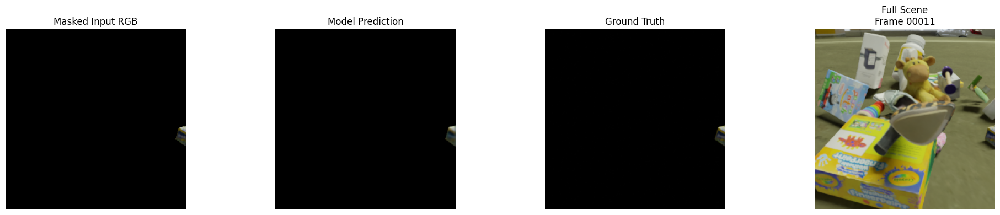

🧾 Sample 1: Object obj_0010, Frame 00013


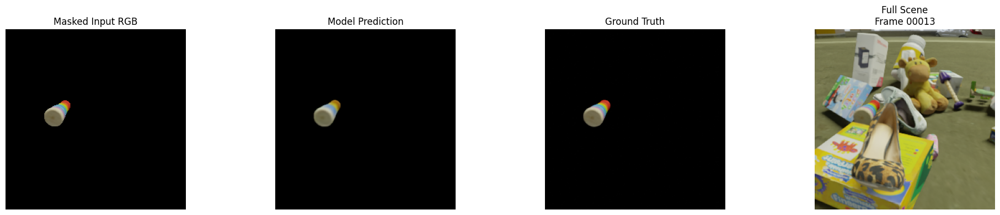

🧾 Sample 2: Object obj_0014, Frame 00004


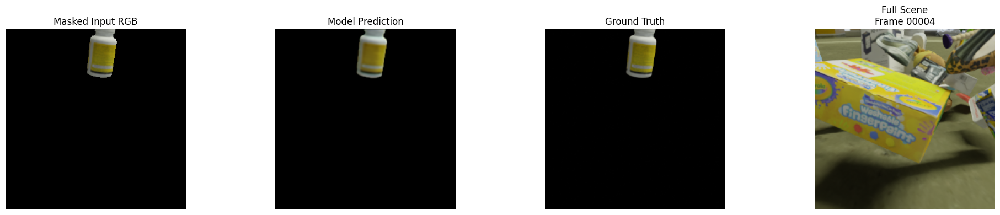

🧾 Sample 3: Object obj_0003, Frame 00011


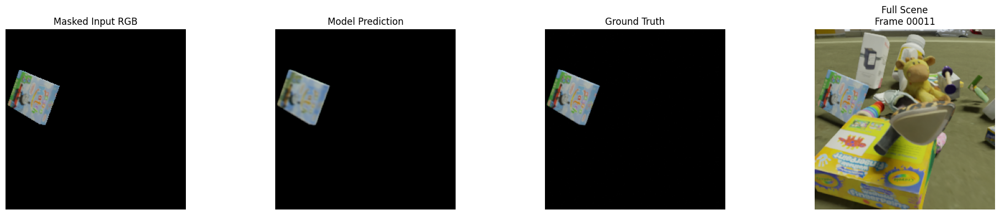

In [ ]:
visualize_predictions(model, test_loader, device, dataset=test_dataset)

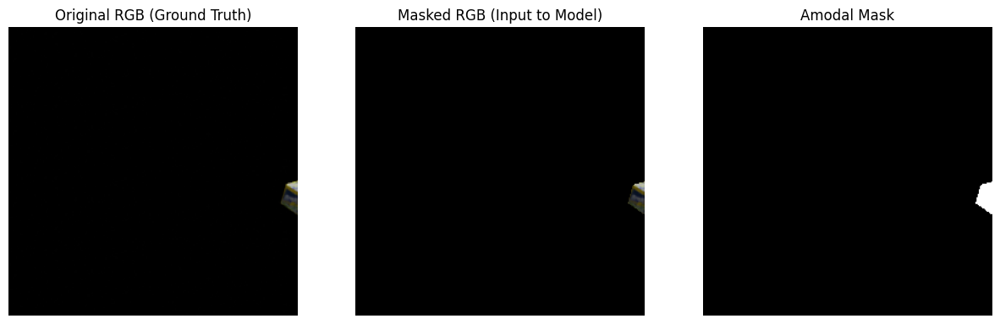

In [ ]:
## JSUT A SANITY CHECK HERE
# import matplotlib.pyplot as plt
# import torchvision.transforms.functional as TF

# def compare_original_vs_masked(dataset, idx=0):
#     input_tensor, target_tensor = dataset[idx]

#     # Extract channels
#     amodal_mask = input_tensor[0:1]       # 1 channel
#     masked_rgb = input_tensor[1:4]        # 3 channels
#     original_rgb = target_tensor          # ground truth RGB

#     # Convert mask to 3 channels for display
#     mask_rgb = amodal_mask.repeat(3, 1, 1)

#     # Plot
#     fig, axs = plt.subplots(1, 3, figsize=(15, 5))
#     axs[0].imshow(TF.to_pil_image(original_rgb))
#     axs[0].set_title("Original RGB (Ground Truth)")

#     axs[1].imshow(TF.to_pil_image(masked_rgb))
#     axs[1].set_title("Masked RGB (Input to Model)")

#     axs[2].imshow(TF.to_pil_image(mask_rgb))
#     axs[2].set_title("Amodal Mask")

#     for ax in axs:
#         ax.axis("off")
#     plt.show()

# # Example usage
# compare_original_vs_masked(test_dataset)


In [ ]:
def visualize_predictions(model, dataloader, device, dataset=None):
    model.eval()
    inputs, targets = next(iter(dataloader))
    inputs = inputs.to(device)
    targets = targets.to(device)

    with torch.no_grad():
        preds = model(inputs)

    n = min(4, inputs.shape[0])
    for i in range(n):
        # Extract components
        amodal_mask = inputs[i, 0:1]         # shape: [1, H, W]
        masked_rgb = inputs[i, 1:4]          # shape: [3, H, W]
        ground_truth = targets[i]
        prediction = preds[i]

        fig, axs = plt.subplots(1, 5, figsize=(25, 5))

        axs[0].imshow(show_tensor(masked_rgb))
        axs[0].set_title("Masked Input RGB")

        axs[1].imshow(show_tensor(prediction))
        axs[1].set_title("Model Prediction")

        axs[2].imshow(show_tensor(ground_truth))
        axs[2].set_title("Ground Truth")

        axs[3].imshow(show_tensor(amodal_mask.repeat(3, 1, 1)))  # Grayscale to RGB
        axs[3].set_title("Amodal Mask")

        # Full scene image (optional if dataset has metadata)
        if dataset is not None and hasattr(dataset, "indices"):
            real_idx = dataset.indices[i]
            sample = dataset.dataset.samples[real_idx]
            obj_path = sample["object_path"]
            frame_id = sample["frame_id"]

            camera_path = obj_path.parent
            full_rgb_path = camera_path / f"rgba_{frame_id}.png"
            full_img = Image.open(full_rgb_path).convert("RGB")

            axs[4].imshow(full_img)
            axs[4].set_title(f"Full Scene\nFrame {frame_id}")

            print(f"🧾 Sample {i}: Object {obj_path.name}, Frame {frame_id}")
        else:
            axs[4].axis("off")

        for ax in axs:
            ax.axis("off")
        plt.tight_layout()
        plt.show()


🧾 Sample 0: Object obj_0015, Frame 00011


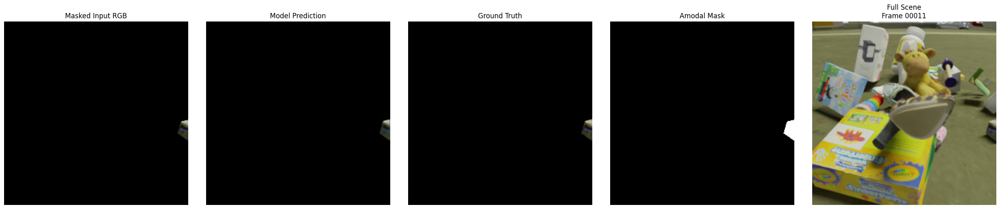

🧾 Sample 1: Object obj_0010, Frame 00013


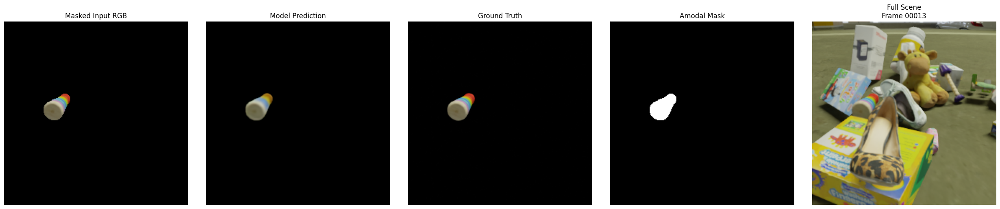

🧾 Sample 2: Object obj_0014, Frame 00004


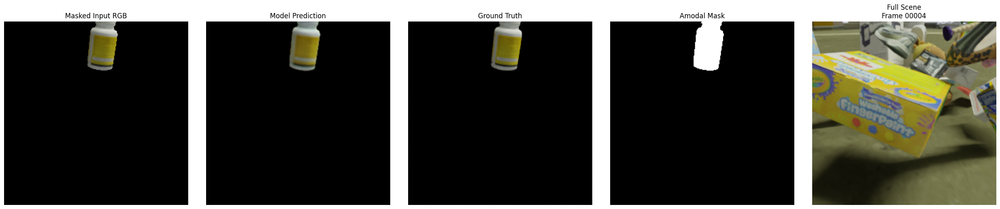

🧾 Sample 3: Object obj_0003, Frame 00011


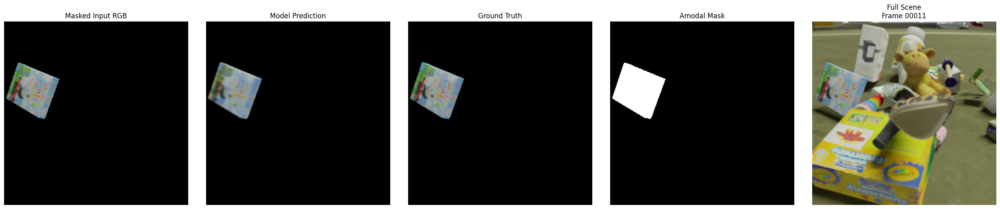

In [ ]:
visualize_predictions(model, test_loader, device, dataset=test_dataset)

In [ ]:
# Get a batch from the test set
model.eval()
x, y = next(iter(test_loader))
x = x.to(device)
y = y.to(device)

with torch.no_grad():
    pred = model(x)
    pred = torch.relu(pred)

# Compute stats
pred_mean = pred.mean().item()
pred_min = pred.min().item()
pred_max = pred.max().item()

target_mean = y.mean().item()
target_min = y.min().item()
target_max = y.max().item()

print(f"Prediction Stats:")
print(f"Mean: {pred_mean:.4f}, Min: {pred_min:.4f}, Max: {pred_max:.4f}")
print(f"Target Stats:")
print(f"Mean: {target_mean:.4f}, Min: {target_min:.4f}, Max: {target_max:.4f}")

In [ ]:
def evaluate_model(model, dataloader, device):
    model.eval()
    total_mse = 0
    total_mae = 0
    total_psnr = 0
    n_batches = 0

    with torch.no_grad():
        for inputs, targets in dataloader:
            inputs = inputs.to(device)
            targets = targets.to(device)

            outputs = torch.relu(model(inputs))  # ← No sigmoid, using ReLU

            mse = F.mse_loss(outputs, targets).item()
            mae = F.l1_loss(outputs, targets).item()

            # PSNR = 20 * log10(MAX_I) - 10 * log10(MSE)
            max_pixel = 1.0
            psnr = 20 * torch.log10(max_pixel / torch.sqrt(F.mse_loss(outputs, targets))).item()

            total_mse += mse
            total_mae += mae
            total_psnr += psnr
            n_batches += 1

    print("Evaluation Results:")
    print(f"Avg MSE  : {total_mse / n_batches:.6f}")
    print(f"Avg MAE  : {total_mae / n_batches:.6f}")
    print(f"Avg PSNR : {total_psnr / n_batches:.2f} dB")
evaluate_model(model, test_loader, device)

In [ ]:
model.eval()
inputs, targets = next(iter(train_loader))
inputs, targets = inputs.to(device), targets.to(device)

with torch.no_grad():
    logits = model(inputs)
    preds = torch.sigmoid(logits)

print(f"Pred mean: {preds.mean().item():.4f}, Target mean: {targets.mean().item():.4f}")


In [ ]:
def evaluate_cropped_vs_predicted_mse(model, dataloader, device, max_samples=5):
    model.eval()
    printed = 0

    with torch.no_grad():
        for inputs, targets in dataloader:
            inputs = inputs.to(device)
            targets = targets.to(device)

            preds = torch.relu(model(inputs))  # [B, 3, H, W]

            for i in range(inputs.size(0)):
                if printed >= max_samples:
                    return

                target_i = targets[i]
                pred_i = preds[i]
                cropped_i = inputs[i, 1:4]  # [3, H, W]

                mse_cropped = F.mse_loss(cropped_i, target_i).item()
                mse_pred = F.mse_loss(pred_i, target_i).item()

                improvement_factor = mse_cropped / mse_pred if mse_pred > 0 else float('inf')

                print(f"Sample {printed + 1}")
                print(f"   Cropped RGB vs GT MSE  : {mse_cropped:.6f}")
                print(f"   Predicted RGB vs GT MSE: {mse_pred:.6f}")
                print(f"   Improvement Factor     : {improvement_factor:.2f}x\n")

                printed += 1


In [ ]:
evaluate_cropped_vs_predicted_mse(model, test_loader, device)


In [ ]:
def calculate_psnr(pred, target, max_val=1.0):
    #compute psnr between tensors
    mse = F.mse_loss(pred, target, reduction='mean').item()
    if mse == 0:
        return float('inf')
    psnr = 10 * math.log10(max_val**2 / mse)
    return psnr

In [ ]:
def evaluate_psnr(model, dataloader, device):
    model.eval()
    total_psnr = 0.0
    count = 0

    with torch.no_grad():
        for inputs, targets in dataloader:
            inputs = inputs.to(device)
            targets = targets.to(device)

            pred = torch.relu(model(inputs))  # assuming ReLU is final activation
            for i in range(inputs.size(0)):
                psnr = calculate_psnr(pred[i], targets[i])
                total_psnr += psnr
                count += 1

    avg_psnr = total_psnr / count
    print(f"Avg PSNR over test set: {avg_psnr:.2f} dB")

In [ ]:
evaluate_psnr(model, test_loader, device)

# Test model on Training

In [ ]:
def show_tensor(tensor_img):
    img = tensor_img.detach().cpu().permute(1, 2, 0).numpy()
    return np.clip(img, 0, 1)

def test_model_on_training_data(model, train_loader, device, criterion=None):
    model.eval()
    with torch.no_grad():
        for inputs, targets in train_loader:
            inputs = inputs.to(device)
            targets = targets.to(device)

            # Run model and apply sigmoid to logits
            logits = model(inputs)
            preds = torch.sigmoid(logits)

            # Optional: calculate training loss on this batch
            if criterion:
                loss = criterion(logits, targets).item()
                print(f"Training batch loss: {loss:.4f}")

            # Visualize first few examples
            n = min(4, inputs.shape[0])
            for i in range(n):
                input_rgb = show_tensor(inputs[i, 1:4])       # masked RGB
                prediction = show_tensor(preds[i])
                ground_truth = show_tensor(targets[i])

                fig, axs = plt.subplots(1, 3, figsize=(12, 4))
                axs[0].imshow(input_rgb)
                axs[0].set_title("Masked Input RGB")
                axs[1].imshow(prediction)
                axs[1].set_title("Model Prediction")
                axs[2].imshow(ground_truth)
                axs[2].set_title("Ground Truth")
                for ax in axs:
                    ax.axis("off")
                plt.show()
            break  # Only run 1 batch


In [ ]:
test_model_on_training_data(model, train_loader, device, criterion)
